### PROJECT_ID   :  PTID-CDS-SEP-24-2088 
### PROJECT_TITLE:  PREDICTING THE SALES PRICE OF HOUSE [PRCP-1020-HousePricePred]

# House Price Prediction - Advanced Regression

# BUISNESS CASE:

## The Housing dataset was compiled by Dean De Cock which is an incredible alternative and an exhaustive dataset with modernized and expanded version of the Boston Housing dataset. The target is to predict the property sales however this requires extensive feature engineering to achieve the same.


## Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.
## With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.


# <font color="green"> GOAL</font > - The goal is to <font color="green">predict the price of the house</font> with the given dataset by using Machine learning Model.

# IMPORT THE BASIC LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
data=pd.read_csv("data.csv")
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
data.shape

(1460, 81)

### The dataset contains 1460 rows with 81 features.

In [4]:
data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


# DOMAIN ANALYSIS:

1.	  MSSubClass: The building class -[ It refers the age of building and number of floors(story) ].
2.	  MSZoning: The general zoning classification
3.	  LotFrontage: Linear feet of street connected to property
4.	  LotArea: Lot size in square feet
5.	  Street: Type of road access
6.	  Alley: Type of alley access
7.	  LotShape: General shape of property
8.	  LandContour: Flatness of the property
9.	  Utilities: Type of utilities available
10.	  LotConfig: Lot configuration
11.	  LandSlope: Slope of property
12.	  Neighborhood: Physical locations within Ames city limits
13.	  Condition1: Proximity to main road or railroad
14.	  Condition2: Proximity to main road or railroad (if a second is present)
15.	  BldgType: Type of dwelling
16.	  HouseStyle: Style of dwelling
17.	  OverallQual: Overall material and finish quality
18.	  OverallCond: Overall condition rating
19.	  YearBuilt: Original construction date
20.	  YearRemodAdd: Remodel date
21.	  RoofStyle: Type of roof
22.	  RoofMatl: Roof material
23.	  Exterior1st: Exterior covering on house
24.	  Exterior2nd: Exterior covering on house (if more than one material)
25.	  MasVnrType: Masonry veneer type
26.	  MasVnrArea: Masonry veneer area in square feet
27.	  ExterQual: Exterior material quality
28.	  ExterCond: Present condition of the material on the exterior
29.	  Foundation: Type of foundation
30.	  BsmtQual: Height of the basement
31.	  BsmtCond: General condition of the basement
32.	  BsmtExposure: Walkout or garden level basement walls
33.	  BsmtFinType1: Quality of basement finished area
34.	  BsmtFinSF1: Type 1 finished square feet
35.	  BsmtFinType2: Quality of second finished area (if present)
36.	  BsmtFinSF2: Type 2 finished square feet
37.	  BsmtUnfSF: Unfinished square feet of basement area
38.	  TotalBsmtSF: Total square feet of basement area
39.	  Heating: Type of heating
40.	  HeatingQC: Heating quality and condition
41.	  CentralAir: Central air conditioning
42.	  Electrical: Electrical system
43.	  1stFlrSF: First Floor square feet
44.	  2ndFlrSF: Second floor square feet
45.	  LowQualFinSF: Low quality finished square feet (all floors)
46.	  GrLivArea: Above grade (ground) living area square feet
47.	  BsmtFullBath: Basement full bathrooms
48.	  BsmtHalfBath: Basement half bathrooms
49.	  FullBath: Full bathrooms above grade
50.	  HalfBath: Half baths above grade
51.	  Bedroom: Number of bedrooms above basement level
52.	  Kitchen: Number of kitchens
53.	  KitchenQual: Kitchen quality
54.	  TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
55.	  Functional: Home functionality rating
56.	  Fireplaces: Number of fireplaces
57.	  FireplaceQu: Fireplace quality
58.	  GarageType: Garage location
59.	  GarageYrBlt: Year garage was built
60.	  GarageFinish: Interior finish of the garage
61.	  GarageCars: Size of garage in car capacity
62.	  GarageArea: Size of garage in square feet
63.	  GarageQual: Garage quality
64.	  GarageCond: Garage condition
65.	  PavedDrive: Paved driveway
66.	  WoodDeckSF: Wood deck area in square feet
67.	  OpenPorchSF: Open porch area in square feet
68.	  EnclosedPorch: Enclosed porch area in square feet
69.	  3SsnPorch: Three season porch area in square feet
70.	  ScreenPorch: Screen porch area in square feet
71.	  PoolArea: Pool area in square feet
72.	  PoolQC: Pool quality
73.	  Fence: Fence quality
74.	  MiscFeature: Miscellaneous feature not covered in other categories
75.	  MiscVal: $Value of miscellaneous feature
76.	  MoSold: Month Sold
77.	  YrSold: Year Sold
78.	  SaleType: Type of sale
79.	  SaleCondition: Condition of sale
80.	  SalePrice - the property sale price in dollars. This is the target variable that   you're trying to predict[TARGET COLUMN].


# BASIC CHECKS

In [5]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [7]:
data.shape

(1460, 81)

In [8]:
pd.set_option('display.max_columns',None)
pd.set_option("display.max_rows",None)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### From the information,some features have more null values.If any features contains more than 25% of null values without any critical information we can drop the particular features.

In [10]:
a=(data.isnull().sum()/len(data))*100
a

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType       59.726027
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [11]:
 a[a >=25]

Alley          93.767123
MasVnrType     59.726027
FireplaceQu    47.260274
PoolQC         99.520548
Fence          80.753425
MiscFeature    96.301370
dtype: float64

### The above features contains more than 25% of null values without critical information,so the relevant features will be dropped.

In [12]:
data.drop(['Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'],axis=1,inplace=True)

### The shape of data after dropping some features

In [13]:
data.shape

(1460, 75)

In [14]:
data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [15]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [16]:
data.describe(include="O")

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,1379,1379,1379,1379,1460,1460,1460
unique,5,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,5,6,4,4,4,6,6,6,5,2,5,4,7,6,3,5,5,3,9,6
top,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
freq,1151,1454,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,870,605,1311,1326,1340,1267,1198


In [17]:
data.drop("Id",axis=1,inplace=True)

In [18]:
data.shape

(1460, 74)

In [19]:
data.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPor

In [20]:
for unique in data.columns:
    print(unique.upper()+":")
    print(data[unique].unique())
    print("--------------------------------")

MSSUBCLASS:
[ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
--------------------------------
MSZONING:
['RL' 'RM' 'C (all)' 'FV' 'RH']
--------------------------------
LOTFRONTAGE:
[ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.]
--------------------------------
LOTAREA:
[ 8450  9600 11250 ... 17217 13175  9717]
--------------------------------
STREET:
['Pave' 'Grvl']
--------------------------------
LOTSHAPE:
['Reg' 'IR1' 'IR2' 'IR3']
-------------------------------

In [21]:
for value in data.columns:
    print(data[value].value_counts())
    print("--------------------------------------")
    print("/n")

MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64
--------------------------------------
/n
MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64
--------------------------------------
/n
LotFrontage
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
64.0      19
24.0      19
73.0      18
55.0      17
63.0      17
79.0      17
72.0      17
100.0     16
66.0      15
74.0      15
51.0      15
52.0      14
59.0      13
82.0      12
71.0      12
67.0      12
43.0      12
40.0      12
57.0      12
76.0      11
69.0      11
92.0      10
34.0      10
53.0      10
86.0      10
88.0      10
84.0       9
35.0       9
62.0       9
44.0       9
77.0       9
93.0       8
98.0       8
96.0       8
61

# EXPLORATORY DATA ANALYSIS:

In [22]:
print(len(data.columns))

74


In [23]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [24]:
data.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPor

In [25]:
text_col=data.select_dtypes(include=["object"])
print(text_col.shape)
text_col.head()

(1460, 37)


,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [26]:
num_col=data.select_dtypes(include=["int","float"])
print(num_col.shape)
num_col

(1460, 37)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


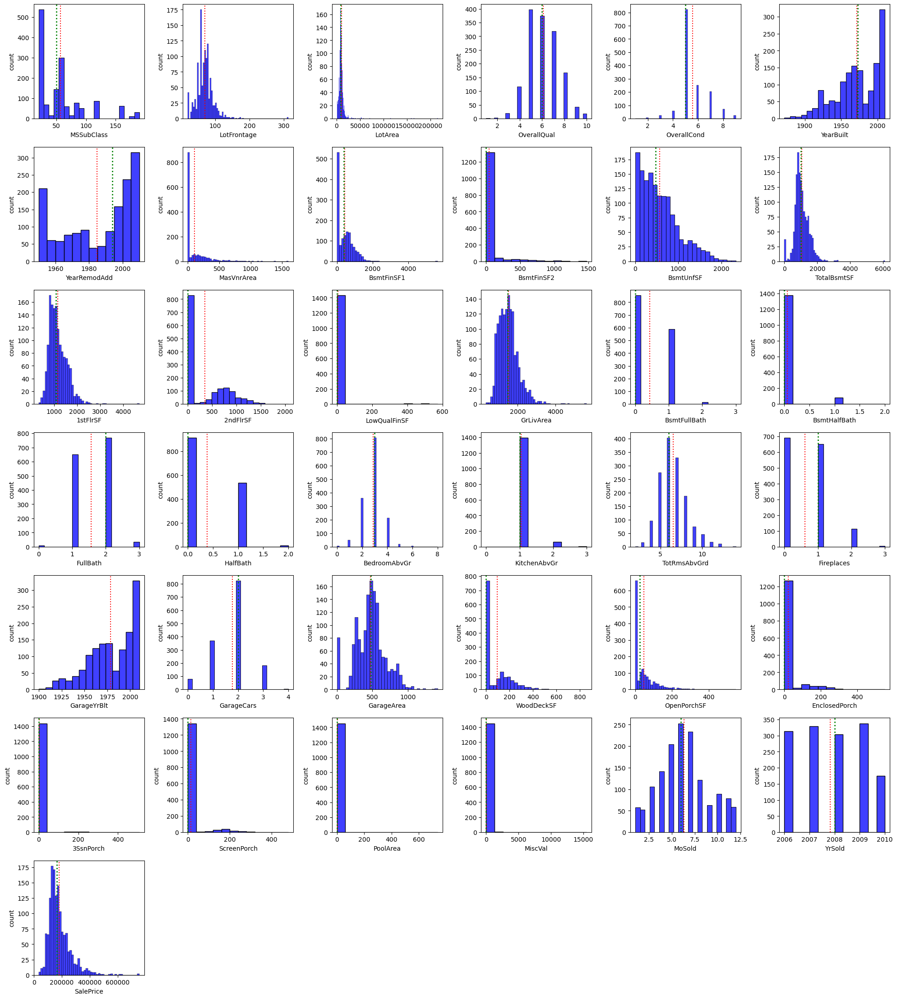

In [27]:
plt.figure(figsize=(20,25),facecolor="white")
plot_1=1
for i in num_col:
    if plot_1<=len(num_col):
        ax=plt.subplot(8,6,plot_1)
        sns.histplot(data=data,x=i,color="blue")
        plt.axvline(np.mean(data[i]),color="red",linestyle="dotted",linewidth=1.5,label="mean")
        plt.axvline(np.median(data[i]),color="green",linestyle="dotted",linewidth=2.0,label="median")
        plt.xlabel(i)
        plt.ylabel("count")
    plot_1+=1
plt.tight_layout()
plt.show()

## Nearly 300 houses were built between 2000 to 2010 in the dataset.
## Overall Quality gives more in average rating (4-6).
## More than 800 houses donot have second floor.
## Nearly 500 houses and more than 1200 houses were no basement or unfinished type of basement in basement 1st part and basement 2nd part respectively.
## More than 800 houses have no full bathroom in basement.
## Nearly 1400 houses have no half bathroom in basement.
## Most of the houses rarely have enclosed porch,3Ssn porch,Pool Area and screen porch.
## Most of the houses sold during the summer times(May-5,June-6,July-7)
## Less houses were sold in the year of 2010.
## Around 800 houses have the capacity of 2 car size garages and the garages were built more during 20s.
## Maximum there will be atleast 1 kitchen are present above the ground.
## Maximum there will be atleast 1 bedroom are present above the ground (highly 3 bedrooms).
## Rarely,there is no room is present above the ground(400 houses 6 no.of rooms).

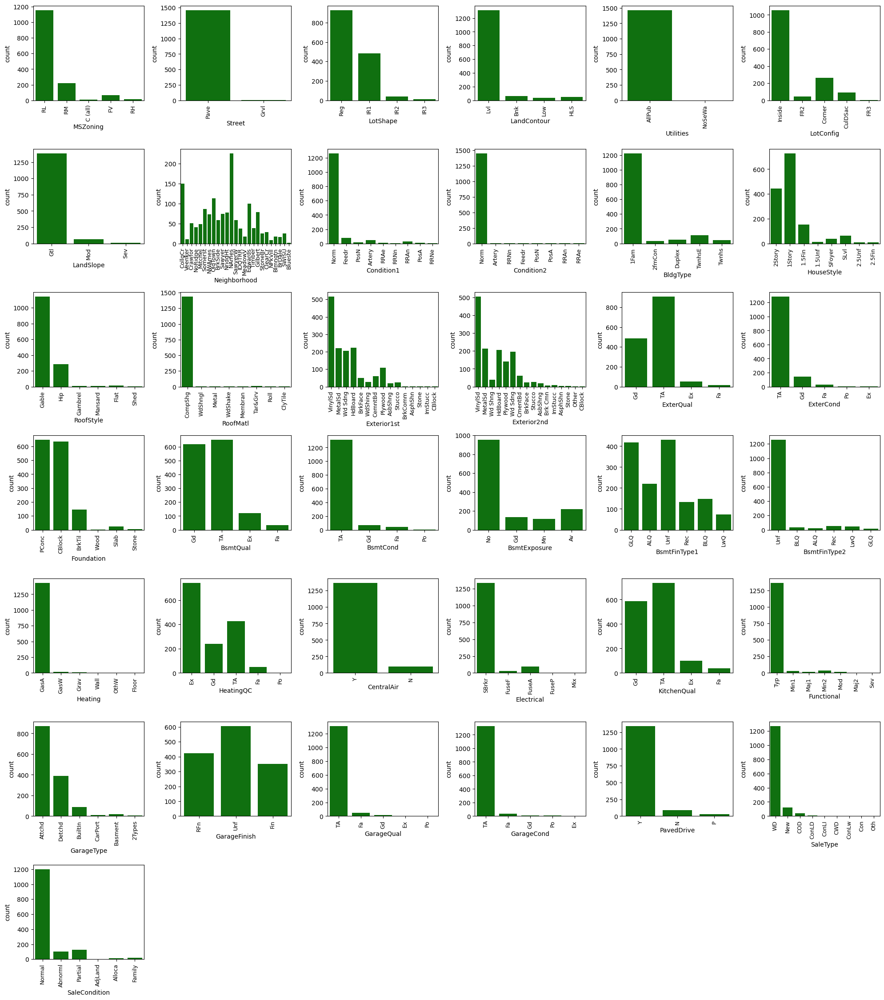

In [28]:
plt.figure(figsize=(20,25),facecolor="white")
plot_txt=1
for i in text_col:
    if plot_txt<=len(text_col):
        ax=plt.subplot(8,6,plot_txt)
        sns.countplot(data=data,x=i,color="green")
        plt.xlabel(i)
        plt.ylabel("count")
        plt.xticks(rotation=90,fontsize=9)
    plot_txt+=1
plt.tight_layout()
plt.show()

## More than 1200 houses have pavement concrete street.
## Majorly,the roofs are made up of composite materials.
## More houses have average exterior quality ,exterior condition,Basement quality and basement condition.
## Around 1300 have the central air conditioning system.
## Most of the houses have standard breaker electrical system which is modern system
## 50% of houses have average kitchen quality.
## More than 90% of houses have sold by warranty deed.
## Around 1200 sold houses have normal condition.
## Majority of garage have the attached type.
## More houses have average garage quality and garage condition.
## Nearly 1000 houses have its lot config inside.

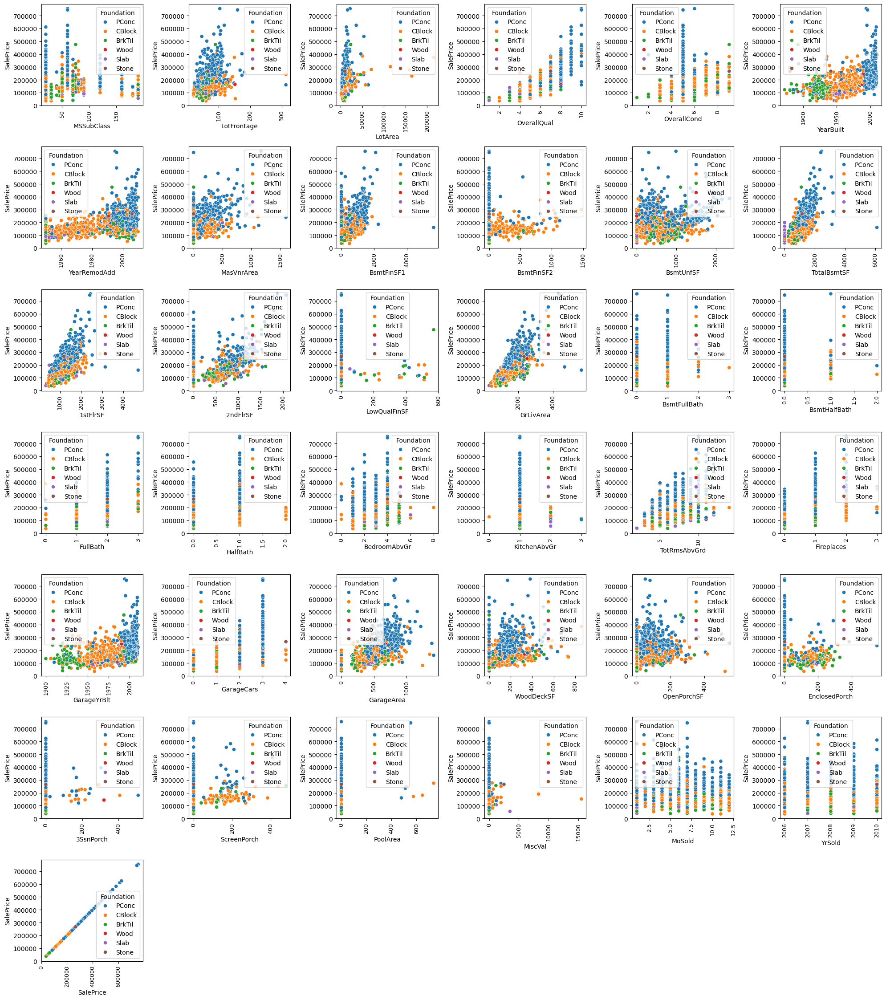

In [29]:
plt.figure(figsize=(20,25),facecolor="white")
plot_s=1
for s in num_col:
    if plot_s<=len(num_col):
        ax=plt.subplot(8,6,plot_s)
        sns.scatterplot(data=data,x=s,y='SalePrice',hue='Foundation',color="purple")
        plt.xlabel(s)
        plt.ylabel('SalePrice')
        plt.xticks(rotation=90,fontsize=9)
    plot_s+=1
plt.tight_layout()
plt.show()

## The house with concrete foundation have more sales price.
## There is more concrete foundation houses around the 2000s.
## As the concrete foundation with basement's sf increases the sales price get increased.
## The Garage built in concrete are more during nearby 20th century.


# DATA PREPROCESSING:

In [30]:
data.head(8)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,60,RL,NaN,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000


## a)CHECK FOR MISSING NULL VALUES:

In [31]:
data.isnull().sum()[data.isnull().sum()>0]


LotFrontage     259
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

In [32]:
data.loc[data["LotFrontage"].isnull(),"LotFrontage"]=np.median(data["LotFrontage"].dropna())

In [33]:
data.loc[data["MasVnrArea"].isnull(),"MasVnrArea"]=np.median(data["MasVnrArea"].dropna())

In [34]:
from statistics import mode

In [35]:
data.loc[data["BsmtQual"].isnull(),"BsmtQual"]=mode(data["BsmtQual"])

In [36]:
data.loc[data["BsmtCond"].isnull(),"BsmtCond"]=mode(data["BsmtCond"])

In [37]:
data.loc[data["BsmtExposure"].isnull(),"BsmtExposure"]=mode(data["BsmtCond"])

In [38]:
data.loc[data["BsmtFinType1"].isnull(),"BsmtFinType1"]=mode(data["BsmtFinType1"])

In [39]:
data.loc[data["BsmtFinType2"].isnull(),"BsmtFinType2"]=mode(data["BsmtFinType2"])

In [40]:
data.loc[data["Electrical"].isnull(),"Electrical"]=mode(data["Electrical"])

In [41]:
data.loc[data["GarageType"].isnull(),"GarageType"]=mode(data["GarageType"])

In [42]:
data.loc[data["GarageYrBlt"].isnull(),"GarageYrBlt"]=np.median(data["GarageYrBlt"].dropna())

In [43]:
data.loc[data["GarageFinish"].isnull(),"GarageFinish"]=mode(data["GarageFinish"])

In [44]:
data.loc[data["GarageQual"].isnull(),"GarageQual"]=mode(data["GarageQual"])

In [45]:
data.loc[data["GarageCond"].isnull(),"GarageCond"]=mode(data["GarageCond"])

In [46]:
data.isnull().sum()[data.isnull().sum()>0]

Series([], dtype: int64)

## There is no null values in dataset.

## b)CHECK FOR DUPLICATE:

In [47]:
data.duplicated().sum()

0

## There is no duplicated data.

## c)FINDING THE OUTLIERS:

In [48]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [49]:
num_col.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

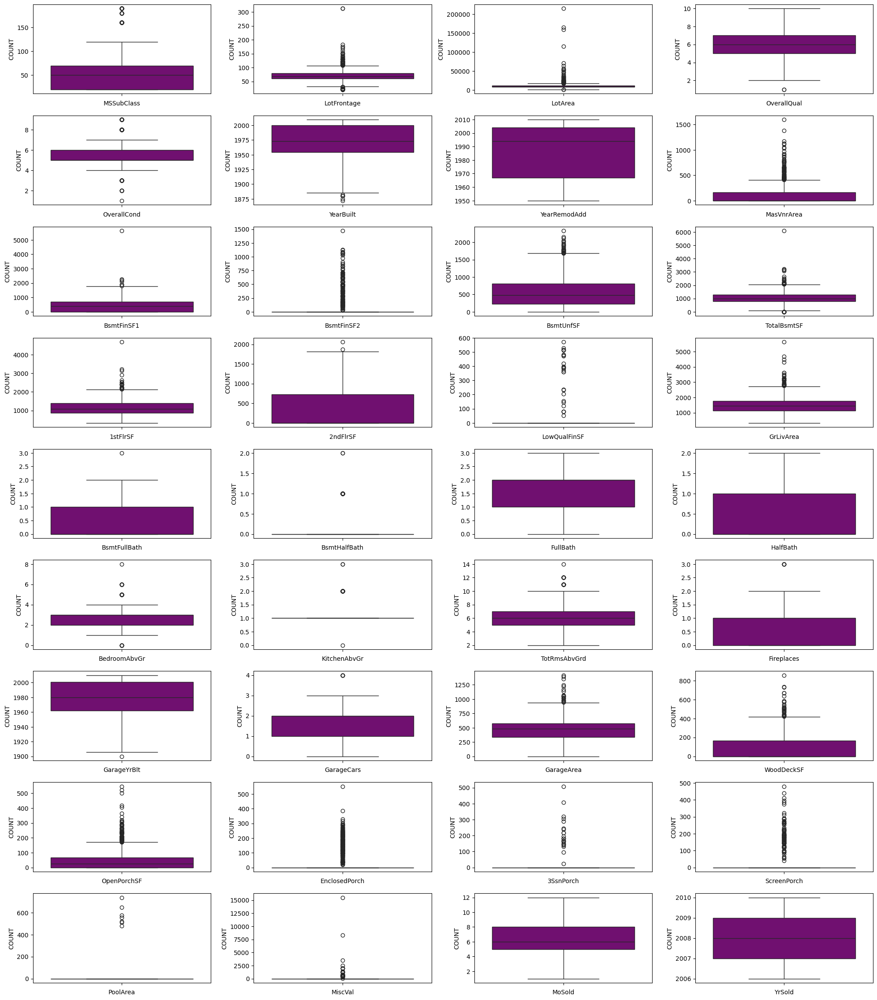

In [50]:
plt.figure(figsize=(20,25),facecolor="white")
plot_o=1
for o in num_col.drop('SalePrice',axis=1):
    if plot_o<=len(num_col):
        ax=plt.subplot(10,4,plot_o)
        sns.boxplot(data=data,y=o,color="purple")
        plt.xlabel(o)
        plt.ylabel('COUNT')
        plt.xticks(rotation=90,fontsize=9)
    plot_o+=1
plt.tight_layout()
plt.show()

### The dataset which features contains the outliers are listed here:
#### 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond','YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2','BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces','GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF','EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'.
       

## THE BELOW LISTED FEATURES HAVE MORE THAN 75% OF DATA WITH THE VALUE OF 0 :
### 1.BsmtFinSF2
### 2.LowQualFinSF
### 3.EnclosedPorch
### 4.SsnPorch
### 5.ScreenPorch
### 6.PoolArea
### 7.MiscVal

In [51]:
data.shape

(1460, 74)

In [52]:
data.drop(data[['BsmtFinSF2','LowQualFinSF','EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']],axis=1,inplace=True)

In [53]:
data.shape

(1460, 67)

# REMOVING THE OUTLIERS:

In [54]:
out=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond','YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces','GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF']

In [55]:
data[out].describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,6.099315,5.575342,1971.267808,103.117123,443.639726,567.240411,1057.429452,1162.626712,346.992466,1515.463699,0.425342,0.057534,2.866438,1.046575,6.517808,0.613014,1978.589041,1.767123,472.980137,94.244521,46.660274
std,42.300571,22.027677,9981.264932,1.382997,1.112799,30.202904,180.731373,456.098091,441.866955,438.705324,386.587738,436.528436,525.480383,0.518911,0.238753,0.815778,0.220338,1.625393,0.644666,23.997022,0.747315,213.804841,125.338794,66.256028
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,1129.500000,0.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,0.000000,383.500000,477.500000,991.500000,1087.000000,0.000000,1464.000000,0.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,164.250000,712.250000,808.000000,1298.250000,1391.250000,728.000000,1776.750000,1.000000,0.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000


In [56]:
data['MSSubClass'].value_counts()

MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64

q1: 20.0 q3: 70.0
IQR: 50.0
ll: -55.0 ul: 145.0


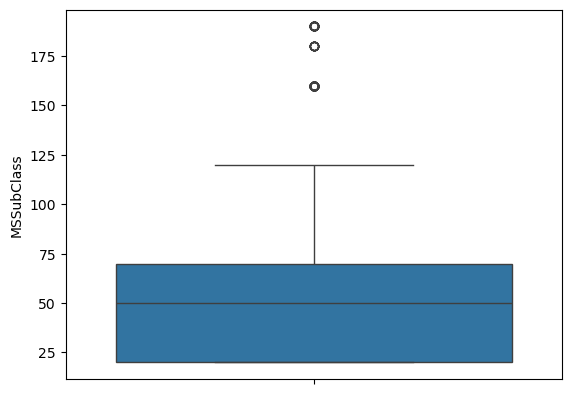

In [57]:
sns.boxplot(data['MSSubClass'])
q1_MSSubClass=data['MSSubClass'].quantile(0.25)
q3_MSSubClass=data['MSSubClass'].quantile(0.75)
print("q1:",q1_MSSubClass,"q3:",q3_MSSubClass)
IQR_MSSubClass=q3_MSSubClass-q1_MSSubClass
print("IQR:",IQR_MSSubClass)
ll_MSSubClass=q1_MSSubClass-1.5*IQR_MSSubClass
ul_MSSubClass=q3_MSSubClass+1.5*IQR_MSSubClass
print("ll:",ll_MSSubClass,"ul:",ul_MSSubClass)

In [58]:
print("percentage of outliers present",(len(data.loc[(data['MSSubClass']<ll_MSSubClass) | (data['MSSubClass']>ul_MSSubClass),'MSSubClass'])/len(data))*100)

percentage of outliers present 7.054794520547945


### WE MAKE THE TRANSFORMATION IN MSSubClass BY LOG TRANSFORMATION

In [59]:
data['MSSubClass']=np.log1p(data['MSSubClass'])

In [60]:
data['MSSubClass']

0       4.110874
1       3.044522
2       4.110874
3       4.262680
4       4.110874
5       3.931826
6       3.044522
7       4.110874
8       3.931826
9       5.252273
10      3.044522
11      4.110874
12      3.044522
13      3.044522
14      3.044522
15      3.828641
16      3.044522
17      4.510860
18      3.044522
19      3.044522
20      4.110874
21      3.828641
22      3.044522
23      4.795791
24      3.044522
25      3.044522
26      3.044522
27      3.044522
28      3.044522
29      3.433987
30      4.262680
31      3.044522
32      3.044522
33      3.044522
34      4.795791
35      4.110874
36      3.044522
37      3.044522
38      3.044522
39      4.510860
40      3.044522
41      3.044522
42      4.454347
43      3.044522
44      3.044522
45      4.795791
46      3.931826
47      3.044522
48      5.252273
49      3.044522
50      4.110874
51      3.931826
52      4.510860
53      3.044522
54      4.394449
55      3.044522
56      5.081404
57      4.110874
58      4.1108

<Axes: ylabel='MSSubClass'>

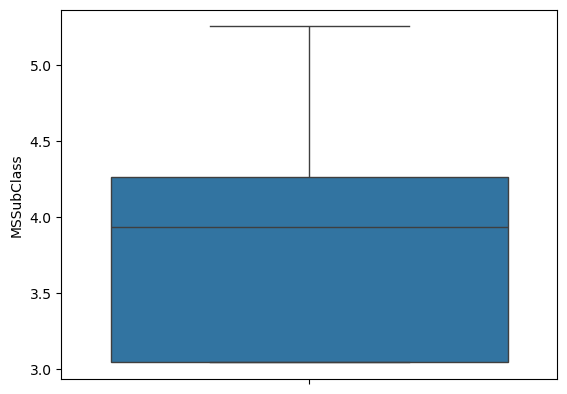

In [61]:
sns.boxplot(data['MSSubClass'])

### After the log transformation there is no outliers

q1: 3.044522437723423 q3: 4.2626798770413155
IQR: 1.2181574393178924
ll: 1.2172862787465843 ul: 6.089916036018154
percentage of outliers present in MSSubClass 0.0


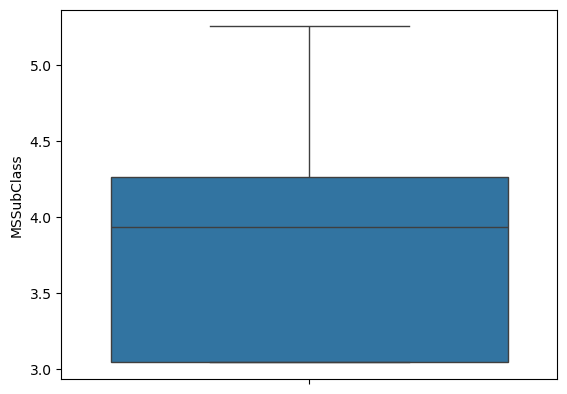

In [62]:
sns.boxplot(data['MSSubClass'])
q1_MSSubClass=data['MSSubClass'].quantile(0.25)
q3_MSSubClass=data['MSSubClass'].quantile(0.75)
print("q1:",q1_MSSubClass,"q3:",q3_MSSubClass)
IQR_MSSubClass=q3_MSSubClass-q1_MSSubClass
print("IQR:",IQR_MSSubClass)
ll_MSSubClass=q1_MSSubClass-1.5*IQR_MSSubClass
ul_MSSubClass=q3_MSSubClass+1.5*IQR_MSSubClass
print("ll:",ll_MSSubClass,"ul:",ul_MSSubClass)
print("percentage of outliers present in MSSubClass",(len(data.loc[(data['MSSubClass']<ll_MSSubClass) | (data['MSSubClass']>ul_MSSubClass),'MSSubClass'])/len(data))*100)

### AFTER THE LOG TRANSFORMATION,THERE IS NO OUTLIERS PRESENT.

q1: 60.0 q3: 79.0
IQR: 19.0
ll: 31.5 ul: 107.5
percentage of outliers present in LotFrontage 7.260273972602739


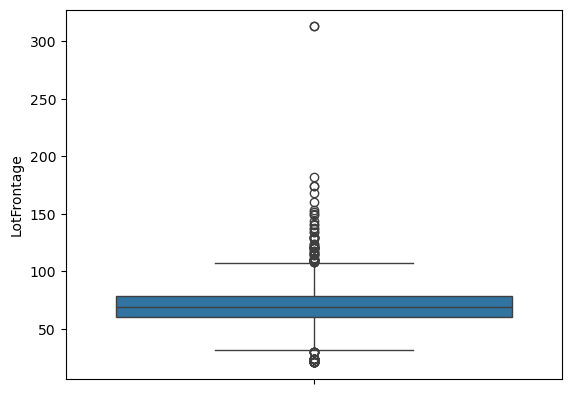

In [63]:
sns.boxplot(data['LotFrontage'])
q1_LotFrontage=data['LotFrontage'].quantile(0.25)
q3_LotFrontage=data['LotFrontage'].quantile(0.75)
print("q1:",q1_LotFrontage,"q3:",q3_LotFrontage)
IQR_LotFrontage=q3_LotFrontage-q1_LotFrontage
print("IQR:",IQR_LotFrontage)
ll_LotFrontage=q1_LotFrontage-1.5*IQR_LotFrontage
ul_LotFrontage=q3_LotFrontage+1.5*IQR_LotFrontage
print("ll:",ll_LotFrontage,"ul:",ul_LotFrontage)
print("percentage of outliers present in LotFrontage",(len(data.loc[(data['LotFrontage']<ll_LotFrontage) | (data['LotFrontage']>ul_LotFrontage),'LotFrontage'])/len(data))*100)

In [64]:
data.loc[(data['LotFrontage']<ll_LotFrontage) | (data['LotFrontage']>ul_LotFrontage),'LotFrontage']=data['LotFrontage'].median()

In [65]:
data['LotArea'].value_counts()

LotArea
7200      25
9600      24
6000      17
9000      14
8400      14
10800     14
1680      10
7500       9
9100       8
8125       8
6120       8
6240       8
3182       7
7800       6
8450       6
4435       5
10140      5
10000      5
5000       5
4500       5
9750       5
5400       5
10400      5
9900       4
13125      4
6600       4
8800       4
8640       4
9375       4
7000       4
8750       4
7018       4
11250      4
8520       4
10625      4
8544       4
8500       4
11700      4
9120       3
8000       3
11600      3
9084       3
6762       3
7750       3
12090      3
8012       3
3675       3
13891      3
10200      3
8777       3
14115      3
10440      3
2280       3
2117       3
2522       3
10500      3
9920       3
9200       3
8712       3
4426       3
7875       3
11500      3
9400       2
1533       2
9760       2
15611      2
9819       2
5500       2
11340      2
14000      2
13500      2
12342      2
14803      2
12000      2
9060       2
9786       2
8773

q1: 7553.5 q3: 11601.5
IQR: 4048.0
ll: 1481.5 ul: 17673.5
percentage of outliers present in LotArea 4.726027397260274


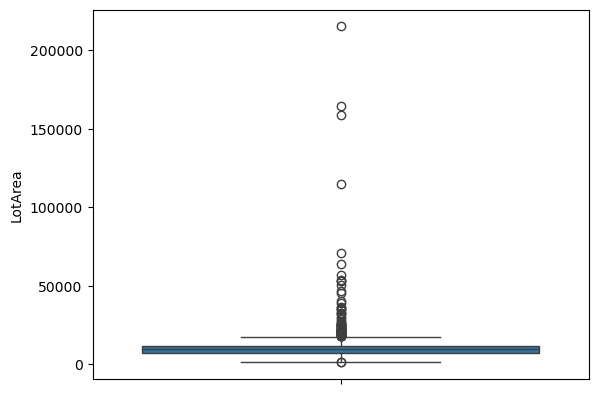

In [66]:
sns.boxplot(data['LotArea'])
q1_LotArea=data['LotArea'].quantile(0.25)
q3_LotArea=data['LotArea'].quantile(0.75)
print("q1:",q1_LotArea,"q3:",q3_LotArea)
IQR_LotArea=q3_LotArea-q1_LotArea
print("IQR:",IQR_LotArea)
ll_LotArea=q1_LotArea-1.5*IQR_LotArea
ul_LotArea=q3_LotArea+1.5*IQR_LotArea
print("ll:",ll_LotArea,"ul:",ul_LotArea)
print("percentage of outliers present in LotArea",(len(data.loc[(data['LotArea']<ll_LotArea) | (data['LotArea']>ul_LotArea),'LotArea'])/len(data))*100)

In [67]:
data.loc[(data['LotArea']<ll_LotArea) | (data['LotArea']>ul_LotArea),'LotArea']=data['LotArea'].median()

### THE OUTLIERS ARE NOT CONSIDERED FOR SOME DISCRETE COLUMNS:

q1: 1954.0 q3: 2000.0
IQR: 46.0
ll: 1885.0 ul: 2069.0
percentage of outliers present in YearBuilt 0.4794520547945206


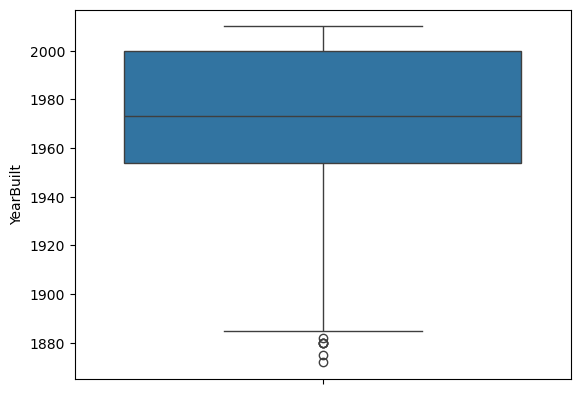

In [68]:
sns.boxplot(data['YearBuilt'])
q1_YearBuilt=data['YearBuilt'].quantile(0.25)
q3_YearBuilt=data['YearBuilt'].quantile(0.75)
print("q1:",q1_YearBuilt,"q3:",q3_YearBuilt)
IQR_YearBuilt=q3_YearBuilt-q1_YearBuilt
print("IQR:",IQR_YearBuilt)
ll_YearBuilt=q1_YearBuilt-1.5*IQR_YearBuilt
ul_YearBuilt=q3_YearBuilt+1.5*IQR_YearBuilt
print("ll:",ll_YearBuilt,"ul:",ul_YearBuilt)
print("percentage of outliers present in YearBuilt",(len(data.loc[(data['YearBuilt']<ll_YearBuilt) | (data['YearBuilt']>ul_YearBuilt),'YearBuilt'])/len(data))*100)

In [69]:
data.loc[(data['YearBuilt']<ll_YearBuilt) | (data['YearBuilt']>ul_YearBuilt),'YearBuilt']=data['YearBuilt'].median()

In [70]:
data[out].describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,3.818794,68.793836,9282.270890,6.099315,5.575342,1971.721233,103.117123,443.639726,567.240411,1057.429452,1162.626712,346.992466,1515.463699,0.425342,0.057534,2.866438,1.046575,6.517808,0.613014,1978.589041,1.767123,472.980137,94.244521,46.660274
std,0.688354,13.846137,3120.532187,1.382997,1.112799,29.506258,180.731373,456.098091,441.866955,438.705324,386.587738,436.528436,525.480383,0.518911,0.238753,0.815778,0.220338,1.625393,0.644666,23.997022,0.747315,213.804841,125.338794,66.256028
min,3.044522,32.000000,1491.000000,1.000000,1.000000,1885.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000
25%,3.044522,60.000000,7560.000000,5.000000,5.000000,1954.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,1129.500000,0.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000
50%,3.931826,69.000000,9478.500000,6.000000,5.000000,1973.000000,0.000000,383.500000,477.500000,991.500000,1087.000000,0.000000,1464.000000,0.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000
75%,4.262680,75.000000,11107.250000,7.000000,6.000000,2000.000000,164.250000,712.250000,808.000000,1298.250000,1391.250000,728.000000,1776.750000,1.000000,0.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000
max,5.252273,107.000000,17671.000000,10.000000,9.000000,2010.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000


q1: 0.0 q3: 164.25
IQR: 164.25
ll: -246.375 ul: 410.625
percentage of outliers present in MasVnrArea 6.712328767123288


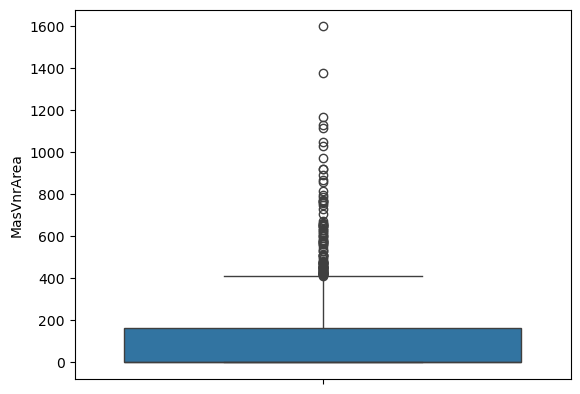

In [71]:
sns.boxplot(data['MasVnrArea'])
q1_MasVnrArea=data['MasVnrArea'].quantile(0.25)
q3_MasVnrArea=data['MasVnrArea'].quantile(0.75)
print("q1:",q1_MasVnrArea,"q3:",q3_MasVnrArea)
IQR_MasVnrArea=q3_MasVnrArea-q1_MasVnrArea
print("IQR:",IQR_MasVnrArea)
ll_MasVnrArea=q1_MasVnrArea-1.5*IQR_MasVnrArea
ul_MasVnrArea=q3_MasVnrArea+1.5*IQR_MasVnrArea
print("ll:",ll_MasVnrArea,"ul:",ul_MasVnrArea)
print("percentage of outliers present in MasVnrArea",(len(data.loc[(data['MasVnrArea']<ll_MasVnrArea) | (data['MasVnrArea']>ul_MasVnrArea),'MasVnrArea'])/len(data))*100)

In [72]:
data['MasVnrArea']

0        196.0
1          0.0
2        162.0
3          0.0
4        350.0
5          0.0
6        186.0
7        240.0
8          0.0
9          0.0
10         0.0
11       286.0
12         0.0
13       306.0
14       212.0
15         0.0
16       180.0
17         0.0
18         0.0
19         0.0
20       380.0
21         0.0
22       281.0
23         0.0
24         0.0
25       640.0
26         0.0
27       200.0
28         0.0
29         0.0
30         0.0
31         0.0
32         0.0
33         0.0
34       246.0
35       132.0
36         0.0
37       650.0
38         0.0
39         0.0
40       101.0
41         0.0
42         0.0
43         0.0
44         0.0
45       412.0
46         0.0
47         0.0
48         0.0
49         0.0
50         0.0
51         0.0
52         0.0
53         0.0
54         0.0
55       272.0
56       456.0
57         0.0
58      1031.0
59         0.0
60         0.0
61         0.0
62       178.0
63         0.0
64       573.0
65       344.0
66       2

In [73]:
data['MasVnrArea']=np.log1p(data['MasVnrArea'])

In [74]:
data['MasVnrArea']

0       5.283204
1       0.000000
2       5.093750
3       0.000000
4       5.860786
5       0.000000
6       5.231109
7       5.484797
8       0.000000
9       0.000000
10      0.000000
11      5.659482
12      0.000000
13      5.726848
14      5.361292
15      0.000000
16      5.198497
17      0.000000
18      0.000000
19      0.000000
20      5.942799
21      0.000000
22      5.641907
23      0.000000
24      0.000000
25      6.463029
26      0.000000
27      5.303305
28      0.000000
29      0.000000
30      0.000000
31      0.000000
32      0.000000
33      0.000000
34      5.509388
35      4.890349
36      0.000000
37      6.478510
38      0.000000
39      0.000000
40      4.624973
41      0.000000
42      0.000000
43      0.000000
44      0.000000
45      6.023448
46      0.000000
47      0.000000
48      0.000000
49      0.000000
50      0.000000
51      0.000000
52      0.000000
53      0.000000
54      0.000000
55      5.609472
56      6.124683
57      0.000000
58      6.9392

<Axes: ylabel='MasVnrArea'>

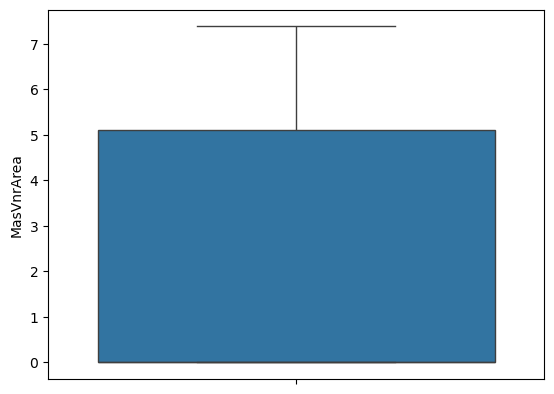

In [75]:
sns.boxplot(data['MasVnrArea'])

### THERE IS NO OULTIERS IN MasVnrArea FEATURES AFTER APPLYING THE LOG TRANSFORMATION

q1: 0.0 q3: 712.25
IQR: 712.25
ll: -1068.375 ul: 1780.625
percentage of outliers present in BsmtFinSF1 0.4794520547945206


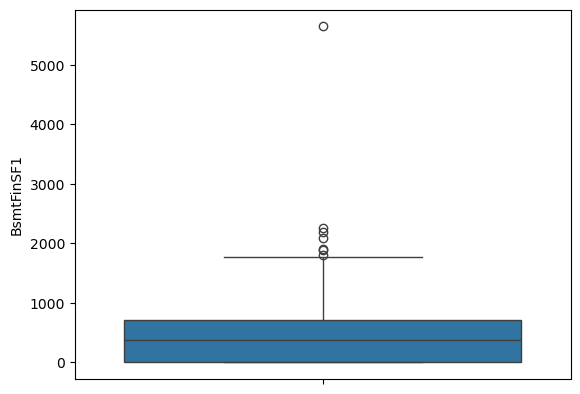

In [76]:
sns.boxplot(data['BsmtFinSF1'])
q1_BsmtFinSF1=data['BsmtFinSF1'].quantile(0.25)
q3_BsmtFinSF1=data['BsmtFinSF1'].quantile(0.75)
print("q1:",q1_BsmtFinSF1,"q3:",q3_BsmtFinSF1)
IQR_BsmtFinSF1=q3_BsmtFinSF1-q1_BsmtFinSF1
print("IQR:",IQR_BsmtFinSF1)
ll_BsmtFinSF1=q1_BsmtFinSF1-1.5*IQR_BsmtFinSF1
ul_BsmtFinSF1=q3_BsmtFinSF1+1.5*IQR_BsmtFinSF1
print("ll:",ll_BsmtFinSF1,"ul:",ul_BsmtFinSF1)
print("percentage of outliers present in BsmtFinSF1",(len(data.loc[(data['BsmtFinSF1']<ll_BsmtFinSF1) | (data['BsmtFinSF1']>ul_BsmtFinSF1),'BsmtFinSF1'])/len(data))*100)

In [77]:
data.loc[(data['BsmtFinSF1']<ll_BsmtFinSF1) | (data['BsmtFinSF1']>ul_BsmtFinSF1),'BsmtFinSF1']=data['BsmtFinSF1'].median()

q1: 223.0 q3: 808.0
IQR: 585.0
ll: -654.5 ul: 1685.5
percentage of outliers present in BsmtUnfSF 1.9863013698630139


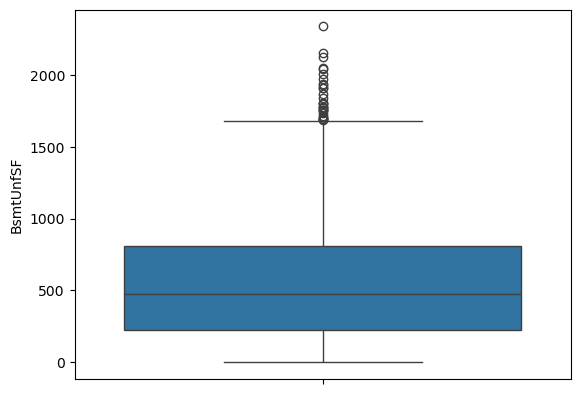

In [78]:
sns.boxplot(data['BsmtUnfSF'])
q1_BsmtUnfSF=data['BsmtUnfSF'].quantile(0.25)
q3_BsmtUnfSF=data['BsmtUnfSF'].quantile(0.75)
print("q1:",q1_BsmtUnfSF,"q3:",q3_BsmtUnfSF)
IQR_BsmtUnfSF=q3_BsmtUnfSF-q1_BsmtUnfSF
print("IQR:",IQR_BsmtUnfSF)
ll_BsmtUnfSF=q1_BsmtUnfSF-1.5*IQR_BsmtUnfSF
ul_BsmtUnfSF=q3_BsmtUnfSF+1.5*IQR_BsmtUnfSF
print("ll:",ll_BsmtUnfSF,"ul:",ul_BsmtUnfSF)
print("percentage of outliers present in BsmtUnfSF",(len(data.loc[(data['BsmtUnfSF']<ll_BsmtUnfSF) | (data['BsmtUnfSF']>ul_BsmtUnfSF),'BsmtUnfSF'])/len(data))*100)

In [79]:
data.loc[(data['BsmtUnfSF']<ll_BsmtUnfSF) | (data['BsmtUnfSF']>ul_BsmtUnfSF),'BsmtUnfSF']=data['BsmtUnfSF'].median()

q1: 795.75 q3: 1298.25
IQR: 502.5
ll: 42.0 ul: 2052.0
percentage of outliers present in TotalBsmtSF 4.178082191780822


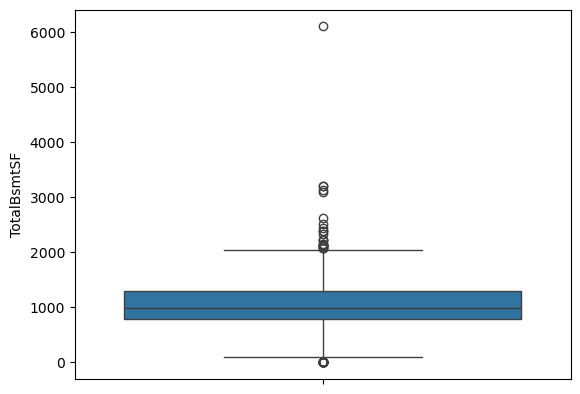

In [80]:
sns.boxplot(data['TotalBsmtSF'])
q1_TotalBsmtSF=data['TotalBsmtSF'].quantile(0.25)
q3_TotalBsmtSF=data['TotalBsmtSF'].quantile(0.75)
print("q1:",q1_TotalBsmtSF,"q3:",q3_TotalBsmtSF)
IQR_TotalBsmtSF=q3_TotalBsmtSF-q1_TotalBsmtSF
print("IQR:",IQR_TotalBsmtSF)
ll_TotalBsmtSF=q1_TotalBsmtSF-1.5*IQR_TotalBsmtSF
ul_TotalBsmtSF=q3_TotalBsmtSF+1.5*IQR_TotalBsmtSF
print("ll:",ll_TotalBsmtSF,"ul:",ul_TotalBsmtSF)
print("percentage of outliers present in TotalBsmtSF",(len(data.loc[(data['TotalBsmtSF']<ll_TotalBsmtSF) | (data['TotalBsmtSF']>ul_TotalBsmtSF),'TotalBsmtSF'])/len(data))*100)

In [81]:
data.loc[(data['TotalBsmtSF']<ll_TotalBsmtSF) | (data['TotalBsmtSF']>ul_TotalBsmtSF),'TotalBsmtSF']=data['TotalBsmtSF'].median()

In [82]:
out=data[out].describe()
out

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,3.818794,68.793836,9282.270890,6.099315,5.575342,1971.721233,2.120264,433.298973,539.783219,1056.884589,1162.626712,346.992466,1515.463699,0.425342,0.057534,2.866438,1.046575,6.517808,0.613014,1978.589041,1.767123,472.980137,94.244521,46.660274
std,0.688354,13.846137,3120.532187,1.382997,1.112799,29.506258,2.628759,423.115209,401.167737,340.833638,386.587738,436.528436,525.480383,0.518911,0.238753,0.815778,0.220338,1.625393,0.644666,23.997022,0.747315,213.804841,125.338794,66.256028
min,3.044522,32.000000,1491.000000,1.000000,1.000000,1885.000000,0.000000,0.000000,0.000000,105.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000
25%,3.044522,60.000000,7560.000000,5.000000,5.000000,1954.000000,0.000000,0.000000,223.000000,816.000000,882.000000,0.000000,1129.500000,0.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000
50%,3.931826,69.000000,9478.500000,6.000000,5.000000,1973.000000,0.000000,383.250000,476.750000,991.500000,1087.000000,0.000000,1464.000000,0.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000
75%,4.262680,75.000000,11107.250000,7.000000,6.000000,2000.000000,5.107456,702.500000,779.250000,1264.500000,1391.250000,728.000000,1776.750000,1.000000,0.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000
max,5.252273,107.000000,17671.000000,10.000000,9.000000,2010.000000,7.378384,1767.000000,1680.000000,2046.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000


q1: 882.0 q3: 1391.25
IQR: 509.25
ll: 118.125 ul: 2155.125
percentage of outliers present in 1stFlrSF 1.36986301369863


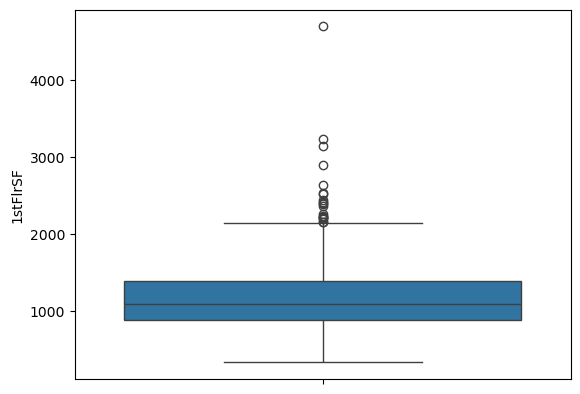

In [83]:
sns.boxplot(data['1stFlrSF'])
q1_1stFlrSF=data['1stFlrSF'].quantile(0.25)
q3_1stFlrSF=data['1stFlrSF'].quantile(0.75)
print("q1:",q1_1stFlrSF,"q3:",q3_1stFlrSF)
IQR_1stFlrSF=q3_1stFlrSF-q1_1stFlrSF
print("IQR:",IQR_1stFlrSF)
ll_1stFlrSF=q1_1stFlrSF-1.5*IQR_1stFlrSF
ul_1stFlrSF=q3_1stFlrSF+1.5*IQR_1stFlrSF
print("ll:",ll_1stFlrSF,"ul:",ul_1stFlrSF)
print("percentage of outliers present in 1stFlrSF",(len(data.loc[(data['1stFlrSF']<ll_1stFlrSF) | (data['1stFlrSF']>ul_1stFlrSF),'1stFlrSF'])/len(data))*100)

In [84]:
data.loc[(data['1stFlrSF']<ll_1stFlrSF) | (data['1stFlrSF']>ul_1stFlrSF),'1stFlrSF']=data['1stFlrSF'].median()

q1: 0.0 q3: 728.0
IQR: 728.0
ll: -1092.0 ul: 1820.0
percentage of outliers present in 2ndFlrSF 0.136986301369863


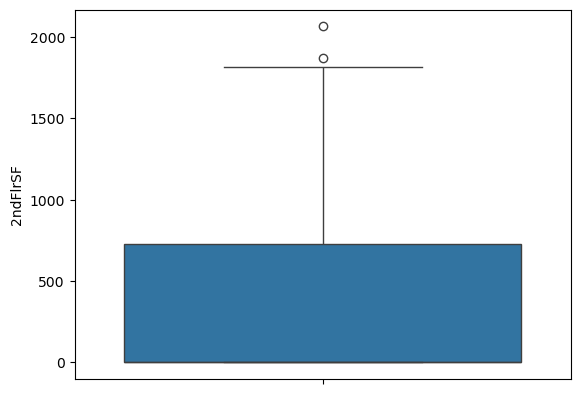

In [85]:
sns.boxplot(data['2ndFlrSF'])
q1_2ndFlrSF=data['2ndFlrSF'].quantile(0.25)
q3_2ndFlrSF=data['2ndFlrSF'].quantile(0.75)
print("q1:",q1_2ndFlrSF,"q3:",q3_2ndFlrSF)
IQR_2ndFlrSF=q3_2ndFlrSF-q1_2ndFlrSF
print("IQR:",IQR_2ndFlrSF)
ll_2ndFlrSF=q1_2ndFlrSF-1.5*IQR_2ndFlrSF
ul_2ndFlrSF=q3_2ndFlrSF+1.5*IQR_2ndFlrSF
print("ll:",ll_2ndFlrSF,"ul:",ul_2ndFlrSF)
print("percentage of outliers present in 2ndFlrSF",(len(data.loc[(data['2ndFlrSF']<ll_2ndFlrSF) | (data['2ndFlrSF']>ul_2ndFlrSF),'2ndFlrSF'])/len(data))*100)

In [86]:
data.loc[(data['2ndFlrSF']<ll_2ndFlrSF) | (data['2ndFlrSF']>ul_2ndFlrSF),'2ndFlrSF']=data['2ndFlrSF'].median()

q1: 1129.5 q3: 1776.75
IQR: 647.25
ll: 158.625 ul: 2747.625
percentage of outliers present in GrLivArea 2.1232876712328768


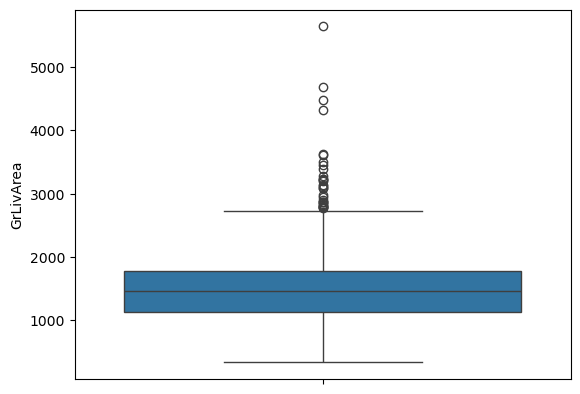

In [87]:
sns.boxplot(data['GrLivArea'])
q1_GrLivArea=data['GrLivArea'].quantile(0.25)
q3_GrLivArea=data['GrLivArea'].quantile(0.75)
print("q1:",q1_GrLivArea,"q3:",q3_GrLivArea)
IQR_GrLivArea=q3_GrLivArea-q1_GrLivArea
print("IQR:",IQR_GrLivArea)
ll_GrLivArea=q1_GrLivArea-1.5*IQR_GrLivArea
ul_GrLivArea=q3_GrLivArea+1.5*IQR_GrLivArea
print("ll:",ll_GrLivArea,"ul:",ul_GrLivArea)
print("percentage of outliers present in GrLivArea",(len(data.loc[(data['GrLivArea']<ll_GrLivArea) | (data['GrLivArea']>ul_GrLivArea),'GrLivArea'])/len(data))*100)

In [88]:
data.loc[(data['GrLivArea']<ll_GrLivArea) | (data['GrLivArea']>ul_GrLivArea),'GrLivArea']=data['GrLivArea'].median()

q1: 334.5 q3: 576.0
IQR: 241.5
ll: -27.75 ul: 938.25
percentage of outliers present in GarageArea 1.4383561643835616


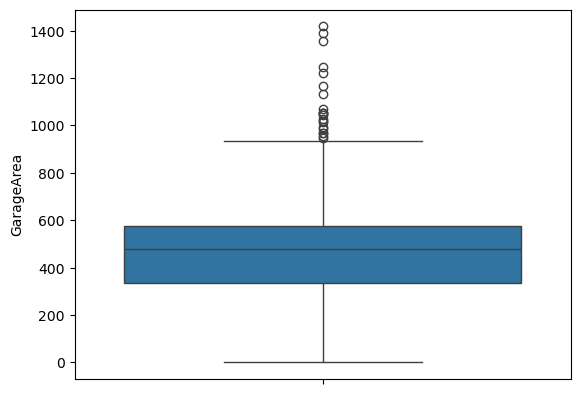

In [89]:
sns.boxplot(data['GarageArea'])
q1_GarageArea=data['GarageArea'].quantile(0.25)
q3_GarageArea=data['GarageArea'].quantile(0.75)
print("q1:",q1_GarageArea,"q3:",q3_GarageArea)
IQR_GarageArea=q3_GarageArea-q1_GarageArea
print("IQR:",IQR_GarageArea)
ll_GarageArea=q1_GarageArea-1.5*IQR_GarageArea
ul_GarageArea=q3_GarageArea+1.5*IQR_GarageArea
print("ll:",ll_GarageArea,"ul:",ul_GarageArea)
print("percentage of outliers present in GarageArea",(len(data.loc[(data['GarageArea']<ll_GarageArea) | (data['GarageArea']>ul_GarageArea),'GarageArea'])/len(data))*100)

In [90]:
data.loc[(data['GarageArea']<ll_GarageArea) | (data['GarageArea']>ul_GarageArea),'GarageArea']=data['GarageArea'].median()

q1: 0.0 q3: 168.0
IQR: 168.0
ll: -252.0 ul: 420.0
percentage of outliers present in WoodDeckSF 2.191780821917808


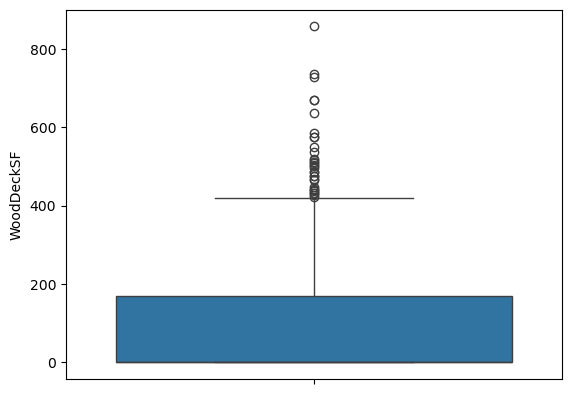

In [91]:
sns.boxplot(data['WoodDeckSF'])
q1_WoodDeckSF=data['WoodDeckSF'].quantile(0.25)
q3_WoodDeckSF=data['WoodDeckSF'].quantile(0.75)
print("q1:",q1_WoodDeckSF,"q3:",q3_WoodDeckSF)
IQR_WoodDeckSF=q3_WoodDeckSF-q1_WoodDeckSF
print("IQR:",IQR_WoodDeckSF)
ll_WoodDeckSF=q1_WoodDeckSF-1.5*IQR_WoodDeckSF
ul_WoodDeckSF=q3_WoodDeckSF+1.5*IQR_WoodDeckSF
print("ll:",ll_WoodDeckSF,"ul:",ul_WoodDeckSF)
print("percentage of outliers present in WoodDeckSF",(len(data.loc[(data['WoodDeckSF']<ll_WoodDeckSF) | (data['WoodDeckSF']>ul_WoodDeckSF),'WoodDeckSF'])/len(data))*100)


In [92]:
data.loc[(data['WoodDeckSF']<ll_WoodDeckSF) | (data['WoodDeckSF']>ul_WoodDeckSF),'WoodDeckSF']=data['WoodDeckSF'].median()

q1: 0.0 q3: 68.0
IQR: 68.0
ll: -102.0 ul: 170.0
percentage of outliers present in OpenPorchSF 5.273972602739726


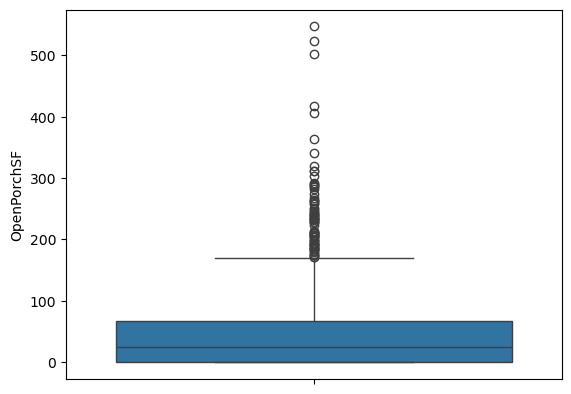

In [93]:
sns.boxplot(data['OpenPorchSF'])
q1_OpenPorchSF=data['OpenPorchSF'].quantile(0.25)
q3_OpenPorchSF=data['OpenPorchSF'].quantile(0.75)
print("q1:",q1_OpenPorchSF,"q3:",q3_OpenPorchSF)
IQR_OpenPorchSF=q3_OpenPorchSF-q1_OpenPorchSF
print("IQR:",IQR_OpenPorchSF)
ll_OpenPorchSF=q1_OpenPorchSF-1.5*IQR_OpenPorchSF
ul_OpenPorchSF=q3_OpenPorchSF+1.5*IQR_OpenPorchSF
print("ll:",ll_OpenPorchSF,"ul:",ul_OpenPorchSF)
print("percentage of outliers present in OpenPorchSF",(len(data.loc[(data['OpenPorchSF']<ll_OpenPorchSF) | (data['OpenPorchSF']>ul_OpenPorchSF),'OpenPorchSF'])/len(data))*100)

In [94]:
data['OpenPorchSF'].value_counts()

OpenPorchSF
0      656
36      29
48      22
20      21
40      19
45      19
24      16
30      16
60      15
39      14
28      14
54      13
50      13
44      13
72      12
32      11
98      11
63      11
35      11
75      10
120     10
96      10
42      10
66       9
64       9
68       8
70       8
78       8
84       8
38       8
16       8
56       8
80       7
102      7
25       7
114      7
27       7
144      7
130      7
33       7
140      6
116      6
26       6
22       6
46       6
51       6
100      6
55       6
104      5
150      5
88       5
65       5
62       5
108      5
21       5
128      5
74       5
18       5
112      5
29       5
90       5
59       5
76       5
110      5
168      4
105      4
34       4
113      4
49       4
82       4
52       4
154      4
57       4
53       3
12       3
192      3
73       3
158      3
124      3
87       3
166      3
69       3
61       3
81       3
234      3
122      3
184      3
151      3
132      3
136      

In [95]:
data.loc[(data['OpenPorchSF']<ll_OpenPorchSF) | (data['OpenPorchSF']>ul_OpenPorchSF),'OpenPorchSF']=data['OpenPorchSF'].median()

### THE LOG TRANSFORMATION IS APPLIED ON MSSubClass AND MasVnrArea FEATURES

# CONVERSION OF CATEGORICAL DATA INTO NUMERICAL DATA USING ENCODING TECHNIQUES:

In [96]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 67 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   float64
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   float64
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [97]:
print("TOTAL SHAPE: ",data.shape)
print("NUMERICAL DATA: ",data.select_dtypes(include=["int","float"]).shape)
print("CATEGORICAL DATA :",data.select_dtypes(include=["object"]).shape)

TOTAL SHAPE:  (1460, 67)
NUMERICAL DATA:  (1460, 30)
CATEGORICAL DATA : (1460, 37)


# THE ENCODING PROCESS SHOULD BE DONE ON 37 FEATURES OR COLUMNS:

In [98]:
text_col=data.select_dtypes(include=["object"])
text_col.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


# BEFORE APPLYING THE ENCODING PROCESS:

In [99]:
text_col.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [100]:
from sklearn.preprocessing import OneHotEncoder,LabelEncoder,OrdinalEncoder
ohe=OneHotEncoder()
label=LabelEncoder()

In [101]:
order_1=OrdinalEncoder(categories=[['Fa', 'TA', 'Gd', 'Ex']]*3)
data[['ExterQual','BsmtQual','KitchenQual']]=order_1.fit_transform(data[['ExterQual','BsmtQual','KitchenQual']])

In [102]:
order_2=OrdinalEncoder(categories=[['Po','Fa','TA','Gd','Ex']]*4)
data[[ 'ExterCond','HeatingQC','GarageQual', 'GarageCond']]=order_2.fit_transform(data[[ 'ExterCond','HeatingQC','GarageQual', 'GarageCond']])

In [103]:
order_3=OrdinalEncoder(categories=[['No', 'Mn', 'Av', 'TA', 'Gd']])
data[['BsmtExposure']]=order_3.fit_transform(data[['BsmtExposure']])

In [104]:
data['BsmtCond'].unique()

array(['TA', 'Gd', 'Fa', 'Po'], dtype=object)

In [105]:
order_4=OrdinalEncoder(categories=[['Po','Fa','TA','Gd']])
data[['BsmtCond']]=order_4.fit_transform(data[['BsmtCond']])

In [106]:
data['BsmtCond'].unique()

array([2., 3., 1., 0.])

In [107]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 67 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   float64
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   float64
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [108]:
data.select_dtypes(include=["object"]).columns

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'Foundation', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
       'CentralAir', 'Electrical', 'Functional', 'GarageType', 'GarageFinish',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [109]:
data['MSZoning']=label.fit_transform(data['MSZoning'])

In [110]:
for j in data[['Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig','LandSlope', 'Neighborhood']]:
    data[j]=label.fit_transform(data[j])

In [111]:
for k in data[['Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'Foundation', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'CentralAir',
       'Electrical', 'Functional']]:
    data[k]=label.fit_transform(data[k])

In [112]:
for l in data[['GarageType', 'GarageFinish', 'PavedDrive', 'SaleType',
       'SaleCondition']]:
    data[l]=label.fit_transform(data[l])

In [113]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 67 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   float64
 1   MSZoning       1460 non-null   int32  
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   float64
 4   Street         1460 non-null   int32  
 5   LotShape       1460 non-null   int32  
 6   LandContour    1460 non-null   int32  
 7   Utilities      1460 non-null   int32  
 8   LotConfig      1460 non-null   int32  
 9   LandSlope      1460 non-null   int32  
 10  Neighborhood   1460 non-null   int32  
 11  Condition1     1460 non-null   int32  
 12  Condition2     1460 non-null   int32  
 13  BldgType       1460 non-null   int32  
 14  HouseStyle     1460 non-null   int32  
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [114]:
data.select_dtypes(include=["object"]).shape

(1460, 0)

## THERE IS NO CATEGORICAL IS PRESENT NOW IN THE TABLE

In [115]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,4.110874,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7,5,2003,2003,1,1,12,13,5.283204,2.0,2.0,2,2.0,2.0,0.0,2,706.0,5,150.0,856.0,1,4.0,1,4,856,854,1710,1,0,2,1,3,1,2.0,8,6,0,1,2003.0,1,2,548,2.0,2.0,2,0,61,2,2008,8,4,208500
1,3.044522,3,80.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6,8,1976,1976,1,1,8,8,0.000000,1.0,2.0,1,2.0,2.0,4.0,0,978.0,5,284.0,1262.0,1,4.0,1,4,1262,0,1262,0,1,2,0,3,1,1.0,6,6,1,1,1976.0,1,2,460,2.0,2.0,2,298,0,5,2007,8,4,181500
2,4.110874,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7,5,2001,2002,1,1,12,13,5.093750,2.0,2.0,2,2.0,2.0,1.0,2,486.0,5,434.0,920.0,1,4.0,1,4,920,866,1786,1,0,2,1,3,1,2.0,6,6,1,1,2001.0,1,2,608,2.0,2.0,2,0,42,9,2008,8,4,223500
3,4.262680,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7,5,1915,1970,1,1,13,15,0.000000,1.0,2.0,0,1.0,3.0,0.0,0,216.0,5,540.0,756.0,1,3.0,1,4,961,756,1717,1,0,1,0,3,1,2.0,7,6,1,5,1998.0,2,3,642,2.0,2.0,2,0,35,2,2006,8,0,140000
4,4.110874,3,84.0,14260.0,1,0,3,0,2,0,15,2,2,0,5,8,5,2000,2000,1,1,12,13,5.860786,2.0,2.0,2,2.0,2.0,2.0,2,655.0,5,490.0,1145.0,1,4.0,1,4,1145,1053,2198,1,0,2,1,4,1,2.0,9,6,1,1,2000.0,1,3,836,2.0,2.0,2,192,84,12,2008,8,4,250000


### BY USING ENCODING TECHNIQUES WE HAVE CONVERTED THE CATEGORICAL DATA INTO NUMERICAL DATA AND THE ABOVE INFORMATION SHOWS THAT THERE IS NO CATEGORICAL VALUES ARE PRESENT.

# CORRELATION:

<Axes: >

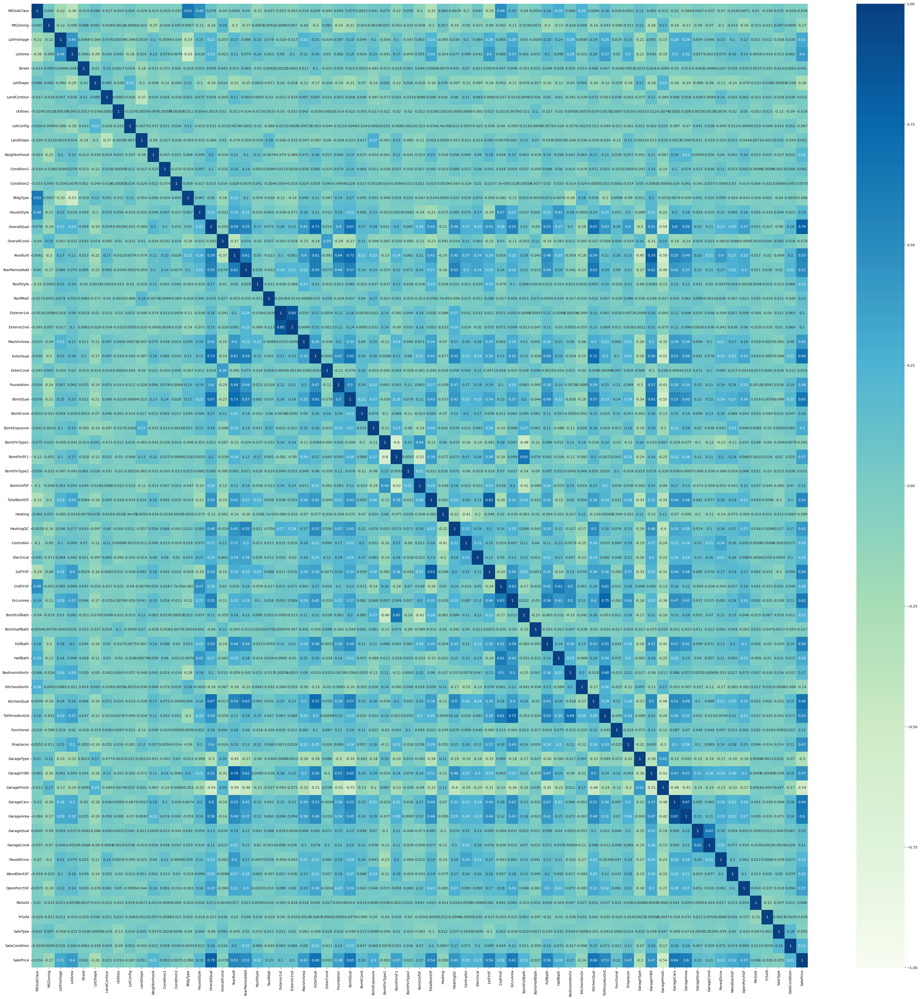

In [116]:
plt.figure(figsize=(50,50),facecolor="white")
sns.heatmap(data.corr(),annot=True,vmin=-1,cmap="GnBu")

In [117]:
feature_corr=data.drop("SalePrice",axis=1).corr()
feature_corr

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
MSSubClass,1.000000,0.045328,-0.224897,-0.361239,-0.013758,0.086137,-0.017476,-0.029458,0.054061,-0.025517,-0.024405,-0.019472,-0.033018,0.633511,0.478160,0.078346,-0.039820,0.006072,0.039769,-0.153516,-0.027090,-0.052843,-0.092830,0.014375,0.038996,-0.045309,0.054316,0.079319,0.001456,0.041042,0.074569,-0.116470,0.055564,-0.104124,-0.311094,0.063680,-0.002898,-0.102008,0.045418,-0.288473,0.482175,0.187640,-0.040138,0.005405,0.181546,0.287581,0.065690,0.257244,0.009386,0.156727,0.015521,0.005168,0.111775,0.063088,-0.012452,-0.010493,-0.084219,0.004659,-0.036674,-0.069972,-0.018246,0.007096,0.010286,-0.027520,0.035146,-0.028398
MSZoning,0.045328,1.000000,-0.115944,-0.085446,0.087654,0.061887,-0.017854,-0.001192,-0.009895,-0.022055,-0.249679,-0.027874,0.044606,0.005690,-0.105315,-0.160099,0.186951,-0.296172,-0.174728,-0.000301,0.005133,-0.008558,0.006963,-0.039625,-0.195689,0.091101,-0.235174,-0.209086,-0.051366,-0.001406,0.024688,-0.051844,-0.031718,-0.048375,-0.103519,0.056866,-0.162866,-0.049523,-0.070818,-0.059990,-0.051671,-0.105432,-0.018526,0.007193,-0.198290,-0.133876,-0.016471,0.049434,-0.160914,-0.043200,-0.095722,-0.011349,0.116007,-0.263772,0.167501,-0.157042,-0.170195,-0.089848,-0.069692,-0.100366,-0.014755,-0.176483,-0.031496,-0.020628,0.097437,0.009494
LotFrontage,-0.224897,-0.115944,1.000000,0.437289,0.006778,-0.084038,0.047286,0.000390,-0.095981,0.001928,0.102255,-0.009377,-0.033924,-0.326581,0.149530,0.218761,-0.057287,0.171097,0.066307,0.153157,0.078547,-0.015588,-0.016928,0.229940,0.148100,-0.033679,0.086982,0.152729,0.048651,0.101050,-0.055798,0.104471,-0.047324,0.062963,0.233336,-0.064589,0.035892,0.104009,0.083546,0.278717,0.084723,0.289336,0.030434,-0.004495,0.176478,0.136356,0.257088,0.008541,0.136551,0.294038,0.018925,0.152613,-0.211306,0.090824,-0.170371,0.280912,0.291102,0.058581,0.045828,0.134143,0.101961,0.125540,0.021218,0.011053,-0.058064,0.035026
LotArea,-0.361239,-0.085446,0.437289,1.000000,-0.006064,-0.293777,0.025698,0.042741,-0.183391,0.023537,0.132239,0.079173,0.007597,-0.529633,0.017684,0.234918,-0.020635,0.105490,0.074317,0.140367,0.052787,0.090029,0.099880,0.123026,0.157387,0.030059,0.062116,0.150706,0.024299,0.148602,-0.041422,0.174015,-0.042806,0.054740,0.330365,-0.024008,0.076571,0.088667,0.041668,0.397362,0.088781,0.365683,0.080963,0.031829,0.203050,0.096056,0.294731,-0.021169,0.164292,0.374778,0.020358,0.296583,-0.215171,0.043096,-0.190405,0.295312,0.318273,0.036525,0.002289,0.079491,0.156114,0.141176,0.005780,-0.019429,-0.012186,0.061989
Street,-0.013758,0.087654,0.006778,-0.006064,1.000000,-0.010224,0.115995,0.001682,0.013960,-0.179360,-0.011561,-0.071657,0.002039,-0.018243,0.023704,0.058823,0.042848,0.022623,0.065465,-0.019732,0.008081,0.002505,0.006166,0.010767,0.100247,-0.015212,0.035277,0.021961,0.002478,-0.090579,-0.013182,-0.018433,0.061285,0.034405,0.006420,0.007904,0.043211,0.069869,0.021324,0.002914,0.047014,0.046458,-0.050524,0.015485,0.046471,0.027628,0.028865,0.013583,0.065669,0.046828,-0.016444,-0.005348,0.001517,0.024339,-0.008277,-0.020025,0.014807,-0.006192,-0.006805,0.024521,0.039173,0.032983,0.003690,-0.025043,0.014339,0.006064
LotShape,0.086137,0.061887,-0.084038,-0.293777,-0.010224,1.000000,0.085434,-0.036101,0.221102,-0.099951,-0.038894,-0.115003,-0.043768,0.1162

## Here we are going to check the correlation between the features:

In [118]:
high_corr=feature_corr[np.abs(feature_corr)>=0.85]
high_corr

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
MSSubClass,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSZoning,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotFrontage,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotArea,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Street,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotShape,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandContour,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Utilities,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotConfig,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandSlope,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
feature_corr.iloc[21:23,21:23]

,Exterior1st,Exterior2nd
Exterior1st,1.000000,0.854163
Exterior2nd,0.854163,1.000000


## THE EXTERIOR 1ST AND THE EXTERIOR 2ND FEATURES HAVE THE CORRELATION MORE THAN  0.85 ,SO ANY ONE OF THESE FEATURES WILL BE DROPPED.EXTERIOR 2ND WILL BE DROPPED HERE.

In [120]:
data.shape

(1460, 67)

In [121]:
data.drop("Exterior2nd",axis=1,inplace=True)

In [122]:
data.shape

(1460, 66)

### NOW THE CORRELATION BETWEEN TARGET AND INPUT VARIABLE WILL BE CHECKED OUT.

In [123]:
tar_corr=data.corr()["SalePrice"].sort_values(ascending=False)
tar_corr

SalePrice        1.000000
OverallQual      0.790982
ExterQual        0.682639
KitchenQual      0.659600
BsmtQual         0.650138
GarageCars       0.640409
GrLivArea        0.616246
GarageArea       0.601400
FullBath         0.560664
1stFlrSF         0.558633
TotalBsmtSF      0.543235
TotRmsAbvGrd     0.533723
YearBuilt        0.532811
YearRemodAdd     0.507101
Fireplaces       0.466929
GarageYrBlt      0.466754
HeatingQC        0.427649
MasVnrArea       0.405162
LotArea          0.403007
Foundation       0.382479
OpenPorchSF      0.368799
BsmtFinSF1       0.365283
LotFrontage      0.313281
WoodDeckSF       0.308855
BsmtExposure     0.300954
HalfBath         0.284108
2ndFlrSF         0.277603
CentralAir       0.251328
Electrical       0.234945
PavedDrive       0.231357
BsmtFullBath     0.227122
RoofStyle        0.222405
SaleCondition    0.213092
Neighborhood     0.210851
HouseStyle       0.180163
BedroomAbvGr     0.168213
BsmtCond         0.159445
GarageQual       0.145904
RoofMatl    

In [124]:
tar_corr[(tar_corr>=-0.01) & (tar_corr<=0.01)]

Condition2    0.007513
Name: SalePrice, dtype: float64

In [125]:
data.Condition2.unique()

array([2, 0, 7, 1, 4, 3, 6, 5])

### THE CONDITION2 FEATURES HAVE NEARLY ZERO CORRELATION WITH TARGET VARIABLES,SO IT CAN BE DROPPED.

In [126]:
data.shape

(1460, 66)

In [127]:
data.drop("Condition2",axis=1,inplace=True)

In [128]:
data.shape

(1460, 65)

In [129]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,4.110874,3,65.0,8450.0,1,3,3,0,4,0,5,2,0,5,7,5,2003,2003,1,1,12,5.283204,2.0,2.0,2,2.0,2.0,0.0,2,706.0,5,150.0,856.0,1,4.0,1,4,856,854,1710,1,0,2,1,3,1,2.0,8,6,0,1,2003.0,1,2,548,2.0,2.0,2,0,61,2,2008,8,4,208500
1,3.044522,3,80.0,9600.0,1,3,3,0,2,0,24,1,0,2,6,8,1976,1976,1,1,8,0.000000,1.0,2.0,1,2.0,2.0,4.0,0,978.0,5,284.0,1262.0,1,4.0,1,4,1262,0,1262,0,1,2,0,3,1,1.0,6,6,1,1,1976.0,1,2,460,2.0,2.0,2,298,0,5,2007,8,4,181500
2,4.110874,3,68.0,11250.0,1,0,3,0,4,0,5,2,0,5,7,5,2001,2002,1,1,12,5.093750,2.0,2.0,2,2.0,2.0,1.0,2,486.0,5,434.0,920.0,1,4.0,1,4,920,866,1786,1,0,2,1,3,1,2.0,6,6,1,1,2001.0,1,2,608,2.0,2.0,2,0,42,9,2008,8,4,223500
3,4.262680,3,60.0,9550.0,1,0,3,0,0,0,6,2,0,5,7,5,1915,1970,1,1,13,0.000000,1.0,2.0,0,1.0,3.0,0.0,0,216.0,5,540.0,756.0,1,3.0,1,4,961,756,1717,1,0,1,0,3,1,2.0,7,6,1,5,1998.0,2,3,642,2.0,2.0,2,0,35,2,2006,8,0,140000
4,4.110874,3,84.0,14260.0,1,0,3,0,2,0,15,2,0,5,8,5,2000,2000,1,1,12,5.860786,2.0,2.0,2,2.0,2.0,2.0,2,655.0,5,490.0,1145.0,1,4.0,1,4,1145,1053,2198,1,0,2,1,4,1,2.0,9,6,1,1,2000.0,1,3,836,2.0,2.0,2,192,84,12,2008,8,4,250000


## Minmaxscaler Techniques will be applied on the data to make the values in range between 0 to 1.

## BEFORE APPLYING THE SCALING TECHNIQUES:

In [130]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,4.110874,3,65.0,8450.0,1,3,3,0,4,0,5,2,0,5,7,5,2003,2003,1,1,12,5.283204,2.0,2.0,2,2.0,2.0,0.0,2,706.0,5,150.0,856.0,1,4.0,1,4,856,854,1710,1,0,2,1,3,1,2.0,8,6,0,1,2003.0,1,2,548,2.0,2.0,2,0,61,2,2008,8,4,208500
1,3.044522,3,80.0,9600.0,1,3,3,0,2,0,24,1,0,2,6,8,1976,1976,1,1,8,0.000000,1.0,2.0,1,2.0,2.0,4.0,0,978.0,5,284.0,1262.0,1,4.0,1,4,1262,0,1262,0,1,2,0,3,1,1.0,6,6,1,1,1976.0,1,2,460,2.0,2.0,2,298,0,5,2007,8,4,181500
2,4.110874,3,68.0,11250.0,1,0,3,0,4,0,5,2,0,5,7,5,2001,2002,1,1,12,5.093750,2.0,2.0,2,2.0,2.0,1.0,2,486.0,5,434.0,920.0,1,4.0,1,4,920,866,1786,1,0,2,1,3,1,2.0,6,6,1,1,2001.0,1,2,608,2.0,2.0,2,0,42,9,2008,8,4,223500
3,4.262680,3,60.0,9550.0,1,0,3,0,0,0,6,2,0,5,7,5,1915,1970,1,1,13,0.000000,1.0,2.0,0,1.0,3.0,0.0,0,216.0,5,540.0,756.0,1,3.0,1,4,961,756,1717,1,0,1,0,3,1,2.0,7,6,1,5,1998.0,2,3,642,2.0,2.0,2,0,35,2,2006,8,0,140000
4,4.110874,3,84.0,14260.0,1,0,3,0,2,0,15,2,0,5,8,5,2000,2000,1,1,12,5.860786,2.0,2.0,2,2.0,2.0,2.0,2,655.0,5,490.0,1145.0,1,4.0,1,4,1145,1053,2198,1,0,2,1,4,1,2.0,9,6,1,1,2000.0,1,3,836,2.0,2.0,2,192,84,12,2008,8,4,250000


In [131]:
data.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF',
       'OpenPorchSF', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition',
       'SalePrice'],
      dt

In [132]:
from sklearn.preprocessing import MinMaxScaler
scale=MinMaxScaler()

In [133]:
data[['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF',
       'OpenPorchSF', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition','SalePrice']]=scale.fit_transform(data[['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
                                               'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
                                               'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual',
                                               'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
                                               'Exterior1st', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
                                               'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
                                               'BsmtFinType2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
                                               'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
                                               'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
                                               'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
                                               'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars',
                                               'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF',
                                               'OpenPorchSF', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition','SalePrice']])

## AFTER APPLYING THE SCALING TECHNIQUES:

In [134]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0.483003,0.75,0.440000,0.430099,1.0,1.0,1.0,0.0,1.0,0.0,0.208333,0.250,0.0,0.714286,0.666667,0.500,0.944,0.883333,0.2,0.142857,0.857143,0.716038,0.666667,0.5,0.4,0.666667,0.666667,0.00,0.4,0.399547,1.0,0.089286,0.386914,0.2,1.00,1.0,1.0,0.289678,0.469747,0.574290,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.666667,0.500000,1.0,0.000000,0.2,0.936364,0.5,0.50,0.585470,0.5,0.5,1.0,0.000000,0.358824,0.090909,0.50,1.0,0.8,0.241078
1,0.000000,0.75,0.640000,0.501174,1.0,1.0,1.0,0.0,0.5,0.0,1.000000,0.125,0.0,0.285714,0.555556,0.875,0.728,0.433333,0.2,0.142857,0.571429,0.000000,0.333333,0.5,0.2,0.666667,0.666667,1.00,0.0,0.553480,1.0,0.169048,0.596084,0.2,1.00,1.0,1.0,0.514983,0.000000,0.387312,0.000000,0.5,0.666667,0.0,0.375,0.333333,0.333333,0.333333,1.0,0.333333,0.2,0.690909,0.5,0.50,0.491453,0.5,0.5,1.0,0.712919,0.000000,0.363636,0.25,1.0,0.8,0.203583
2,0.483003,0.75,0.480000,0.603152,1.0,0.0,1.0,0.0,1.0,0.0,0.208333,0.250,0.0,0.714286,0.666667,0.500,0.928,0.866667,0.2,0.142857,0.857143,0.690361,0.666667,0.5,0.4,0.666667,0.666667,0.25,0.4,0.275042,1.0,0.258333,0.419887,0.2,1.00,1.0,1.0,0.325194,0.476348,0.606010,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.666667,0.333333,1.0,0.333333,0.2,0.918182,0.5,0.50,0.649573,0.5,0.5,1.0,0.000000,0.247059,0.727273,0.50,1.0,0.8,0.261908
3,0.551764,0.75,0.373333,0.498084,1.0,0.0,1.0,0.0,0.0,0.0,0.250000,0.250,0.0,0.714286,0.666667,0.500,0.240,0.333333,0.2,0.142857,0.928571,0.000000,0.333333,0.5,0.0,0.333333,1.000000,0.00,0.0,0.122241,1.0,0.321429,0.335394,0.2,0.75,1.0,1.0,0.347947,0.415842,0.577212,0.333333,0.0,0.333333,0.0,0.375,0.333333,0.666667,0.416667,1.0,0.333333,1.0,0.890909,1.0,0.75,0.685897,0.5,0.5,1.0,0.000000,0.205882,0.090909,0.00,1.0,0.0,0.145952
4,0.483003,0.75,0.693333,0.789184,1.0,0.0,1.0,0.0,0.5,0.0,0.625000,0.250,0.0,0.714286,0.777778,0.500,0.920,0.833333,0.2,0.142857,0.857143,0.794318,0.666667,0.5,0.4,0.666667,0.666667,0.50,0.4,0.370685,1.0,0.291667,0.535806,0.2,1.00,1.0,1.0,0.450055,0.579208,0.777963,0.333333,0.0,0.666667,0.5,0.500,0.333333,0.666667,0.583333,1.0,0.333333,0.2,0.909091,0.5,0.75,0.893162,0.5,0.5,1.0,0.459330,0.494118,1.000000,0.50,1.0,0.8,0.298709


## Now the data have the value in between 0 to 1.

# MODEL CREATION

In [135]:
x=data.drop("SalePrice",axis=1)
y=data["SalePrice"]

In [136]:
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,0.483003,0.75,0.440000,0.430099,1.0,1.0,1.0,0.0,1.0,0.0,0.208333,0.250,0.0,0.714286,0.666667,0.500,0.944,0.883333,0.2,0.142857,0.857143,0.716038,0.666667,0.5,0.4,0.666667,0.666667,0.00,0.4,0.399547,1.0,0.089286,0.386914,0.2,1.00,1.0,1.0,0.289678,0.469747,0.574290,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.666667,0.500000,1.0,0.000000,0.2,0.936364,0.5,0.50,0.585470,0.5,0.5,1.0,0.000000,0.358824,0.090909,0.50,1.0,0.8
1,0.000000,0.75,0.640000,0.501174,1.0,1.0,1.0,0.0,0.5,0.0,1.000000,0.125,0.0,0.285714,0.555556,0.875,0.728,0.433333,0.2,0.142857,0.571429,0.000000,0.333333,0.5,0.2,0.666667,0.666667,1.00,0.0,0.553480,1.0,0.169048,0.596084,0.2,1.00,1.0,1.0,0.514983,0.000000,0.387312,0.000000,0.5,0.666667,0.0,0.375,0.333333,0.333333,0.333333,1.0,0.333333,0.2,0.690909,0.5,0.50,0.491453,0.5,0.5,1.0,0.712919,0.000000,0.363636,0.25,1.0,0.8
2,0.483003,0.75,0.480000,0.603152,1.0,0.0,1.0,0.0,1.0,0.0,0.208333,0.250,0.0,0.714286,0.666667,0.500,0.928,0.866667,0.2,0.142857,0.857143,0.690361,0.666667,0.5,0.4,0.666667,0.666667,0.25,0.4,0.275042,1.0,0.258333,0.419887,0.2,1.00,1.0,1.0,0.325194,0.476348,0.606010,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.666667,0.333333,1.0,0.333333,0.2,0.918182,0.5,0.50,0.649573,0.5,0.5,1.0,0.000000,0.247059,0.727273,0.50,1.0,0.8
3,0.551764,0.75,0.373333,0.498084,1.0,0.0,1.0,0.0,0.0,0.0,0.250000,0.250,0.0,0.714286,0.666667,0.500,0.240,0.333333,0.2,0.142857,0.928571,0.000000,0.333333,0.5,0.0,0.333333,1.000000,0.00,0.0,0.122241,1.0,0.321429,0.335394,0.2,0.75,1.0,1.0,0.347947,0.415842,0.577212,0.333333,0.0,0.333333,0.0,0.375,0.333333,0.666667,0.416667,1.0,0.333333,1.0,0.890909,1.0,0.75,0.685897,0.5,0.5,1.0,0.000000,0.205882,0.090909,0.00,1.0,0.0
4,0.483003,0.75,0.693333,0.789184,1.0,0.0,1.0,0.0,0.5,0.0,0.625000,0.250,0.0,0.714286,0.777778,0.500,0.920,0.833333,0.2,0.142857,0.857143,0.794318,0.666667,0.5,0.4,0.666667,0.666667,0.50,0.4,0.370685,1.0,0.291667,0.535806,0.2,1.00,1.0,1.0,0.450055,0.579208,0.777963,0.333333,0.0,0.666667,0.5,0.500,0.333333,0.666667,0.583333,1.0,0.333333,0.2,0.909091,0.5,0.75,0.893162,0.5,0.5,1.0,0.459330,0.494118,1.000000,0.50,1.0,0.8


In [137]:
y.head()

0    0.241078
1    0.203583
2    0.261908
3    0.145952
4    0.298709
Name: SalePrice, dtype: float64

# LINEAR REGRESSION:

In [138]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

In [139]:
from sklearn.linear_model import LinearRegression
line=LinearRegression()
line.fit(x_train,y_train)

LinearRegression()

In [140]:
y_pre_line=line.predict(x_test)

In [141]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [142]:
x_train.shape

(1168, 64)

In [143]:
y_train.shape

(1168,)

## N -> NUMBER OF OBSERVATIONS IN TRAINING SET(ROWS)
## P -> NUMBER OF INDEPENDENT VARIABLES IN TRAINING SET(COLUMNS)

In [144]:
N=y_train.shape[0]
P=x_train.shape[1]
print(N,P)

1168 64


In [145]:
mse_linear_regression=mean_squared_error(y_test,y_pre_line)
mae_linear_regression=mean_absolute_error(y_test,y_pre_line)
rmse_linear_regression=np.sqrt(mse_linear_regression)
r2_linear_regression=r2_score(y_test,y_pre_line)
adj_r2_linear_regression=1 - (1 - r2_linear_regression) * (N - 1) / (N - P - 1)
print("MSE FOR linear_regression:",mse_linear_regression)
print("MAE FOR linear_regression:",mae_linear_regression)
print("RMSE FOR linear_regression:",rmse_linear_regression)
print("R2_SCORE:",r2_linear_regression)
print("ADJUSTED R2 SCORE:",adj_r2_linear_regression)

MSE FOR linear_regression: 0.0028825192385737177
MAE FOR linear_regression: 0.031543480202317585
RMSE FOR linear_regression: 0.05368909794896649
R2_SCORE: 0.805130441066299
ADJUSTED R2 SCORE: 0.7938234131680607


# RIDGE REGRESSION:

In [153]:
from sklearn.linear_model import Ridge

In [154]:
ridge=Ridge()
ridge.fit(x_train,y_train)

Ridge()

In [155]:
y_pre_ridge=ridge.predict(x_test)

In [156]:
mse_ridge=mean_squared_error(y_test,y_pre_ridge)
mae_ridge=mean_absolute_error(y_test,y_pre_ridge)
rmse_ridge=np.sqrt(mse_ridge)
r2_ridge=r2_score(y_test,y_pre_ridge)
adj_r2_ridge=1 - (1 - r2_ridge) * (N - 1) / (N - P - 1)

print("MSE FOR ridge:",mse_ridge)
print("MAE FOR ridge:",mae_ridge)
print("RMSE FOR ridge:",rmse_ridge)
print("R2_SCORE:",r2_ridge)
print("ADJUSTED R2 SCORE:",adj_r2_ridge)

MSE FOR ridge: 0.002883386715141065
MAE FOR ridge: 0.031059310972437946
RMSE FOR ridge: 0.053697176044379326
R2_SCORE: 0.8050717962621978
ADJUSTED R2 SCORE: 0.7937613655829419


# SUPPORT VECTOR MACHINE:

In [157]:
y_train.head()

254     0.152895
1066    0.198722
638     0.069574
799     0.194556
380     0.127899
Name: SalePrice, dtype: float64

In [158]:
y_test.head()

892     0.166088
1105    0.402861
413     0.111235
522     0.172337
1036    0.389668
Name: SalePrice, dtype: float64

In [159]:
from sklearn.svm import SVR
svr=SVR(kernel="linear")
svr.fit(x_train,y_train)

SVR(kernel='linear')

In [160]:
y_pre_svr=svr.predict(x_test)

In [161]:
mse_svr=mean_squared_error(y_test,y_pre_svr)
mae_svr=mean_absolute_error(y_test,y_pre_svr)
rmse_svr=np.sqrt(mse_svr)
r2_svr=r2_score(y_test,y_pre_svr)
adj_r2_svr=1 - (1 - r2_svr) * (N - 1) / (N - P - 1)


print("MSE FOR svr:",mse_svr)
print("MAE FOR svr:",mae_svr)
print("RMSE FOR svr:",rmse_svr)
print("R2_SCORE:",r2_svr)
print("ADJUSTED R2 SCORE:",adj_r2_svr)

MSE FOR svr: 0.003929004020452651
MAE FOR svr: 0.045353410583035
RMSE FOR svr: 0.06268176784721895
R2_SCORE: 0.7343839825009497
ADJUSTED R2 SCORE: 0.7189719923650121


# HYPERPARAMETER IN SUPPORT VECTOR MACHINE:

In [162]:
from sklearn.model_selection import cross_val_score
k_svm=range(2,15)
cv_svm=[]
for i in k_svm:
    CV_svm=SVR()
    score_svm=cross_val_score(CV_svm,x,y,cv=i,scoring="r2")
    cv_svm.append(score_svm.mean())
    print(i,score_svm.mean(),score_svm.std())
best_k_svm=k_svm[np.argmax(cv_svm)]
print("The Optimal k_value for svm: ",best_k_svm)

2 0.6804617358447739 0.06268083036141603
3 0.7129877738573948 0.041388993450450696
4 0.7090392621515481 0.04857718559826238
5 0.7045425819493267 0.05749909325871965
6 0.7041621186994004 0.055088039381970516
7 0.7103781726380992 0.05483930882827783
8 0.7095347042037778 0.06277786917066604
9 0.7058603617513444 0.06607590730152488
10 0.713668609122957 0.0492937524126808
11 0.7156742582621581 0.0664340817911738
12 0.7139972935584119 0.06551735989565734
13 0.7079629626206141 0.07629742938958348
14 0.7140519269791429 0.06600456251817471
The Optimal k_value for svm:  11


In [163]:
from sklearn.model_selection import GridSearchCV
param_svm={
    "C":[0.0001,0.001,0.001,0.1,1,10,100],
    "gamma":[1,0.1,0.01,0.001,0.0001]
}
grid_svm=GridSearchCV(SVR(),param_svm,verbose=3,scoring="r2",cv=2,n_jobs=-1)

In [164]:
#grid_svm.fit(x_train,y_train)

Fitting 2 folds for each of 35 candidates, totalling 70 fits


GridSearchCV(cv=2, estimator=SVR(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.001, 0.1, 1, 10, 100],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             scoring='r2', verbose=3)

In [165]:
#print(grid_svm.best_params_)
#print(grid_svm.best_score_)
#print(grid_svm.best_estimator_)

{'C': 10, 'gamma': 0.01}
0.6519406240373504
SVR(C=10, gamma=0.01)


In [166]:
hp_svm=SVR(C=10, gamma=0.01)
hp_svm.fit(x_train,y_train)

SVR(C=10, gamma=0.01)

In [167]:
y_pre_hp_svm=hp_svm.predict(x_test)

In [169]:
mse_hp_svm=mean_squared_error(y_test,y_pre_hp_svm)
mae_hp_svm=mean_absolute_error(y_test,y_pre_hp_svm)
rmse_hp_svm=np.sqrt(mse_hp_svm)
r2_hp_svm=r2_score(y_test,y_pre_hp_svm)
adj_r2_hp_svm=1 - (1 - r2_hp_svm) * (N - 1) / (N - P - 1)


print("MSE FOR hp_svm:",mse_hp_svm)
print("MAE FOR hp_svm:",mae_hp_svm)
print("RMSE FOR hp_svm:",rmse_hp_svm)
print("R2_SCORE:",r2_hp_svm)
print("ADJUSTED R2 SCORE:",adj_r2_hp_svm)

MSE FOR hp_svm: 0.00417215940685257
MAE FOR hp_svm: 0.04631992398765596
RMSE FOR hp_svm: 0.06459225500671555
R2_SCORE: 0.7179457286756079
ADJUSTED R2 SCORE: 0.7015799323340294


# DECISION TREE:

In [170]:
from sklearn.tree import DecisionTreeRegressor

In [171]:
dt=DecisionTreeRegressor(random_state=42)
dt.fit(x_train,y_train)

DecisionTreeRegressor(random_state=42)

In [172]:
y_pre_dt=dt.predict(x_test)

In [173]:
mse_dt=mean_squared_error(y_test,y_pre_dt)
mae_dt=mean_absolute_error(y_test,y_pre_dt)
rmse_dt=np.sqrt(mse_dt)
r2_dt=r2_score(y_test,y_pre_dt)
adj_r2_dt=1 - (1 - r2_dt) * (N - 1) / (N - P - 1)


print("MSE FOR dt:",mse_dt)
print("MAE FOR dt:",mae_dt)
print("RMSE FOR dt:",rmse_dt)
print("R2_SCORE:",r2_dt)
print("ADJUSTED R2 SCORE:",adj_r2_dt)

MSE FOR dt: 0.0033881629886229133
MAE FOR dt: 0.03826155708967362
RMSE FOR dt: 0.0582079289154228
R2_SCORE: 0.7709469486437386
ADJUSTED R2 SCORE: 0.757656472409105


# HYPERPARAMETER IN DECISION TREE:

In [174]:
from sklearn.model_selection import cross_val_score
k_dt=range(2,15)
cv_dt=[]
for i in k_dt:
    score_dt=cross_val_score(dt,x,y,cv=i,scoring="r2")
    cv_dt.append(score_dt.mean())
    print(i,score_dt.mean(),score_dt.std())
best_k_dt=k_dt[np.argmax(cv_dt)]
print("The Optimal k_value for dt: ",best_k_dt)

2 0.5582581710738583 0.06097127183930584
3 0.7010203351743415 0.04062085755007431
4 0.6843304397139074 0.0695505250406102
5 0.6875896372325664 0.053802966966572
6 0.6917375506443993 0.03579736846357934
7 0.6836974576955172 0.07029667775153103
8 0.666568694133576 0.06683256024959572
9 0.6729916199996508 0.08695510800653193
10 0.7232340859121443 0.05969900565854869
11 0.6871489284278641 0.10220236014281354
12 0.6698369019862174 0.10767821136656087
13 0.6771681218332523 0.10629982648102995
14 0.7077582623445353 0.10186408413393336
The Optimal k_value for dt:  10


In [175]:
from sklearn.model_selection import GridSearchCV
param_dt={
    "criterion":["squared_error","absolute_error", "poisson"],
    "splitter":["best","random"],
    "max_depth":(list(range(1,10))),
    "max_features":["sqrt","log2"],
    "min_samples_leaf":(list(range(1,10))),
    "min_samples_split":(list(range(1,10)))
}

In [171]:
#grid_dt=GridSearchCV(dt,param_grid=param_dt,cv=10,scoring="r2",verbose=3,n_jobs=-1)

In [172]:
#grid_dt.fit(x_train,y_train)

In [173]:
#print(grid_dt.best_params_)
#print(grid_dt.best_score_)
#print(grid_dt.best_estimator_)

In [176]:
hp_dt=DecisionTreeRegressor(criterion='absolute_error', max_depth=9,
                      max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=9, random_state=42)
hp_dt.fit(x_train,y_train)

DecisionTreeRegressor(criterion='absolute_error', max_depth=9,
                      max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=9, random_state=42)

In [177]:
y_pre_hp_dt=hp_dt.predict(x_test)

In [178]:
mse_hp_dt=mean_squared_error(y_test,y_pre_hp_dt)
mae_hp_dt=mean_absolute_error(y_test,y_pre_hp_dt)
rmse_hp_dt=np.sqrt(mse_hp_dt)
r2_hp_dt=r2_score(y_test,y_pre_hp_dt)
adj_r2_hp_dt=1 - (1 - r2_hp_dt) * (N - 1) / (N - P - 1)


print("MSE FOR hp_dt:",mse_hp_dt)
print("MAE FOR hp_dt:",mae_hp_dt)
print("RMSE FOR hp_dt:",rmse_hp_dt)
print("R2_SCORE:",r2_hp_dt)
print("ADJUSTED R2 SCORE:",adj_r2_hp_dt)

MSE FOR hp_dt: 0.0025371649103344772
MAE FOR hp_dt: 0.03600610312875114
RMSE FOR hp_dt: 0.0503702780450384
R2_SCORE: 0.8284777425237302
ADJUSTED R2 SCORE: 0.8185254084543909


# RANDOM FOREST:

In [179]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=200,random_state=42)
rf.fit(x_train,y_train)

RandomForestRegressor(n_estimators=200, random_state=42)

In [180]:
y_pre_rf=rf.predict(x_test)

In [181]:
mse_rf=mean_squared_error(y_test,y_pre_rf)
mae_rf=mean_absolute_error(y_test,y_pre_rf)
rmse_rf=np.sqrt(mse_rf)
r2_rf=r2_score(y_test,y_pre_rf)
adj_r2_rf=1 - (1 - r2_rf) * (N - 1) / (N - P - 1)


print("MSE FOR rf:",mse_rf)
print("MAE FOR rf:",mae_rf)
print("RMSE FOR rf:",rmse_rf)
print("R2_SCORE:",r2_rf)
print("ADJUSTED R2 SCORE:",adj_r2_rf)

MSE FOR rf: 0.0018747716611884377
MAE FOR rf: 0.025209207625272734
RMSE FOR rf: 0.04329863347945796
R2_SCORE: 0.8732581133099523
ADJUSTED R2 SCORE: 0.8659040963125243


# HYPERPARAMETER PARAMETER IN RANDOM FORESET:

In [182]:
from sklearn.model_selection import cross_val_score
k_rf=range(2,6)
cv_rf=[]
for i in k_rf:
    score_rf=cross_val_score(rf,x,y,cv=i,scoring="r2")
    cv_rf.append(score_rf.mean())
    print(i,score_rf.mean(),score_rf.std())
best_k_rf=k_rf[np.argmax(cv_rf)]
print("The Optimal k_value for rf: ",best_k_rf)

2 0.8348868398437153 0.0014086999950060908
3 0.8344695621419961 0.019059527215001707
4 0.8407778357922862 0.014229199474304122
5 0.852044327641741 0.022544358462873573
The Optimal k_value for rf:  5


In [183]:
from sklearn.model_selection import GridSearchCV
param_rf={
    "n_estimators":[int(i) for i in np.arange(100,701,100)],
    "max_depth":(list(range(2,6))),
    "max_features":["sqrt","log2"],
    "min_samples_leaf":(list(range(2,6))),
    "min_samples_split":(list(range(2,6)))
}

In [182]:
#grid_rf=GridSearchCV(RandomForestRegressor(random_state=42),param_rf,cv=5,scoring="r2",verbose=2,n_jobs=-1)

In [183]:
#grid_rf.fit(x_train,y_train)

In [184]:
#print(grid_rf.best_params_)
#print(grid_rf.best_score_)
#print(grid_rf.best_estimator_)

In [184]:
hp_rf=RandomForestRegressor(max_depth=5, max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=5, n_estimators=600, random_state=42)
hp_rf.fit(x_train,y_train)

RandomForestRegressor(max_depth=5, max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=5, n_estimators=600, random_state=42)

In [185]:
y_pre_hp_rf=hp_rf.predict(x_test)

In [186]:
mse_hp_rf=mean_squared_error(y_test,y_pre_hp_rf)
mae_hp_rf=mean_absolute_error(y_test,y_pre_hp_rf)
rmse_hp_rf=np.sqrt(mse_hp_rf)
r2_hp_rf=r2_score(y_test,y_pre_hp_rf)
adj_r2_hp_rf=1 - (1 - r2_hp_rf) * (N - 1) / (N - P - 1)


print("MSE FOR hp_rf:",mse_hp_rf)
print("MAE FOR hp_rf:",mae_hp_rf)
print("RMSE FOR hp_rf:",rmse_hp_rf)
print("R2_SCORE:",r2_hp_rf)
print("ADJUSTED R2 SCORE:",adj_r2_hp_rf)

MSE FOR hp_rf: 0.002755315285517897
MAE FOR hp_rf: 0.03055316061101869
RMSE FOR hp_rf: 0.05249109720245803
R2_SCORE: 0.8137299251200034
ADJUSTED R2 SCORE: 0.8029218700045729


# XGBOOSTING:

In [187]:
!pip install XGBoost

In [188]:
from xgboost import XGBRegressor

In [189]:
xgb=XGBRegressor(random_state=42,n_estimators=600)
xgb.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=600, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [190]:
y_pre_xgb=xgb.predict(x_test)

In [191]:
mse_xgb=mean_squared_error(y_test,y_pre_xgb)
mae_xgb=mean_absolute_error(y_test,y_pre_xgb)
rmse_xgb=np.sqrt(mse_xgb)
r2_xgb=r2_score(y_test,y_pre_xgb)
adj_r2_xgb=1 - (1 - r2_xgb) * (N - 1) / (N - P - 1)


print("MSE FOR xgb:",mse_xgb)
print("MAE FOR xgb:",mae_xgb)
print("RMSE FOR xgb:",rmse_xgb)
print("R2_SCORE:",r2_xgb)
print("ADJUSTED R2 SCORE:",adj_r2_xgb)

MSE FOR xgb: 0.001989546200360425
MAE FOR xgb: 0.02522367960573934
RMSE FOR xgb: 0.04460432939032292
R2_SCORE: 0.8654989061810068
ADJUSTED R2 SCORE: 0.8576946722694786


# HYPERPARAMETER TUNING FOR XGBOOSTING:

In [192]:
from sklearn.model_selection import cross_val_score
k_xgb=range(2,7)
cv_xgb=[]
for i in k_xgb:
    score_xgb=cross_val_score(xgb,x,y,cv=i,scoring="r2")
    cv_xgb.append(score_xgb.mean())
    print(i,score_xgb.mean(),score_xgb.std())
best_k_xgb=k_xgb[np.argmax(cv_xgb)]
print("The Optimal k_value for xgb: ",best_k_xgb)

2 0.8236137050794721 0.011187188599357523
3 0.8416009683376316 0.005913090614766114
4 0.847684896990426 0.014981911160578414
5 0.8569694342112049 0.02178076649212494
6 0.8483997930844773 0.037844713956900596
The Optimal k_value for xgb:  5


In [193]:
from sklearn.model_selection import GridSearchCV
param_xgb={
    "n_estimators":[100,200,300,400],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [1, 1.5, 2]
}

In [195]:
#grid_xgb=GridSearchCV(XGBRegressor(random_state=42),param_xgb,cv=5,scoring="r2",verbose=4,n_jobs=-1)

In [196]:
#grid_xgb.fit(x_train,y_train)

Fitting 5 folds for each of 8748 candidates, totalling 43740 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'gamma': [0, 0.1, 0.2],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200, 300, 400],
                         'reg_alpha': [0, 0.01, 0.1], 'reg_lambda': [1, 1.5, 2],
                         'subsample': [0.7, 0.8, 0.9]},
             scoring='r2', verbose=4)

In [199]:
#print(grid_xgb.best_params_)
#print(grid_xgb.best_score_)
#print(grid_xgb.best_estimator_.get_params())

{'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 400, 'reg_alpha': 0, 'reg_lambda': 2, 'subsample': 0.8}
0.8659065041659554
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.8, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 3, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 400, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': 0, 'reg_lambda': 2, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.8, 'tree_method': None

In [196]:
#print(grid_xgb.best_estimator_)

In [197]:
hp_xgb=XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=float('nan'), monotone_constraints=None,
             multi_strategy=None, n_estimators=400, n_jobs=None,
             num_parallel_tree=None, random_state=42, reg_alpha= 0, reg_lambda= 2, 
             sampling_method= None,scale_pos_weight= None, 
             subsample= 0.8,tree_method= None,validate_parameters= None,verbosity= None)


In [198]:
hp_xgb.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=400, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [199]:
y_pre_hp_xgb=xgb.predict(x_test)

In [201]:
mse_hp_xgb=mean_squared_error(y_test,y_pre_hp_xgb)
mae_hp_xgb=mean_absolute_error(y_test,y_pre_hp_xgb)
rmse_hp_xgb=np.sqrt(mse_hp_xgb)
r2_hp_xgb=r2_score(y_test,y_pre_hp_xgb)
adj_r2_hp_xgb=1 - (1 - r2_hp_xgb) * (N - 1) / (N - P - 1)


print("MSE FOR hp_xgb:",mse_hp_xgb)
print("MAE FOR hp_xgb:",mae_hp_xgb)
print("RMSE FOR hp_xgb:",rmse_hp_xgb)
print("R2_SCORE:",r2_hp_xgb)
print("ADJUSTED R2 SCORE:",adj_r2_hp_xgb)

MSE FOR hp_xgb: 0.001989546200360425
MAE FOR hp_xgb: 0.02522367960573934
RMSE FOR hp_xgb: 0.04460432939032292
R2_SCORE: 0.8654989061810068
ADJUSTED R2 SCORE: 0.8576946722694786


# GRADIENT BOOSTING:

In [202]:
from sklearn.ensemble import GradientBoostingRegressor
gb=GradientBoostingRegressor(random_state=42,n_estimators=1000)
gb.fit(x_train,y_train)

GradientBoostingRegressor(n_estimators=1000, random_state=42)

In [203]:
y_pre_gb=gb.predict(x_test)

In [204]:
mse_gb=mean_squared_error(y_test,y_pre_gb)
mae_gb=mean_absolute_error(y_test,y_pre_gb)
rmse_gb=np.sqrt(mse_gb)
r2_gb=r2_score(y_test,y_pre_gb)
adj_r2_gb=1 - (1 - r2_gb) * (N - 1) / (N - P - 1)


print("MSE FOR gb:",mse_gb)
print("MAE FOR gb:",mae_gb)
print("RMSE FOR gb:",rmse_gb)
print("R2_SCORE:",r2_gb)
print("ADJUSTED R2 SCORE:",adj_r2_gb)

MSE FOR gb: 0.0016218115159114424
MAE FOR gb: 0.02419274229388805
RMSE FOR gb: 0.040271721044815585
R2_SCORE: 0.8903592071303439
ADJUSTED R2 SCORE: 0.8839974566827845


# HYPERPARAMETER TUNING FOR GRADIENT BOOSTING:

In [205]:
'''from sklearn.model_selection import cross_val_score
k_gb=range(2,11)
cv_gb=[]
for i in k_gb:
    score_gb=cross_val_score(gb,x,y,cv=i,scoring="r2")
    cv_gb.append(score_gb.mean())
    print(i,score_gb.mean(),score_gb.std())
best_k_gb=k_gb[np.argmax(cv_gb)]
print("The Optimal k_value for gb: ",best_k_gb)'''

2 0.843997045864263 0.005890468188784914
3 0.8597094270875415 0.024441530094018036
4 0.864095694103452 0.017131108974396313
5 0.8685874948636532 0.02564619897762934
6 0.8625558858752128 0.039877915278798026
7 0.8553753106088946 0.037873133168832826
8 0.8662318795967596 0.029882840739709038
9 0.8634991363830575 0.04728657109146355
10 0.8685576863516303 0.039498631249942594
The Optimal k_value for gb:  5


In [210]:
from sklearn.model_selection import GridSearchCV
param_gb={
    "n_estimators":[int(i) for i in np.arange(200,601,100)],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9],
    "max_features": ["sqrt", "log2"] ,
    "min_samples_split": [2,3,4,5],     
    "min_samples_leaf": [2,3,4,5] 
}

In [ ]:
#grid_hp_gb=GridSearchCV(GradientBoostingRegressor(random_state=42),param_gb,cv=10,scoring="r2",verbose=4,n_jobs=-1)

In [219]:
#grid_hp_gb.fit(x_train,y_train)

Fitting 10 folds for each of 4320 candidates, totalling 43200 fits


GridSearchCV(cv=10, estimator=GradientBoostingRegressor(random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [2, 3, 4, 5],
                         'min_samples_split': [2, 3, 4, 5],
                         'n_estimators': [200, 300, 400, 500, 600],
                         'subsample': [0.7, 0.8, 0.9]},
             scoring='r2', verbose=4)

In [220]:
#print(grid_hp_gb.best_params_)
#print(grid_hp_gb.best_score_)
#print(grid_hp_gb.best_estimator_)

{'learning_rate': 0.01, 'max_depth': 7, 'max_features': 'log2', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 600, 'subsample': 0.7}
0.869583178080477
GradientBoostingRegressor(learning_rate=0.01, max_depth=7, max_features='log2',
                          min_samples_leaf=5, n_estimators=600, random_state=42,
                          subsample=0.7)


In [211]:
hp_gb=GradientBoostingRegressor(learning_rate=0.01, max_depth=7, max_features='log2',
                          min_samples_leaf=5, n_estimators=1500, random_state=42,
                          subsample=0.7)
hp_gb.fit(x_train,y_train)

GradientBoostingRegressor(learning_rate=0.01, max_depth=7, max_features='log2',
                          min_samples_leaf=5, n_estimators=1500,
                          random_state=42, subsample=0.7)

In [212]:
y_pre_hp_gb=hp_gb.predict(x_test)

In [213]:
mse_hp_gb=mean_squared_error(y_test,y_pre_hp_gb)
mae_hp_gb=mean_absolute_error(y_test,y_pre_hp_gb)
rmse_hp_gb=np.sqrt(mse_hp_gb)
r2_hp_gb=r2_score(y_test,y_pre_hp_gb)
adj_r2_hp_gb=1 - (1 - r2_hp_gb) * (N - 1) / (N - P - 1)


print("MSE FOR hp_xgb:",mse_hp_gb)
print("MAE FOR hp_xgb:",mae_hp_gb)
print("RMSE FOR hp_xgb:",rmse_hp_gb)
print("R2_SCORE:",r2_hp_gb)
print("ADJUSTED R2 SCORE:",adj_r2_hp_gb)

MSE FOR hp_xgb: 0.0015598863519332975
MAE FOR hp_xgb: 0.022114336096391487
RMSE FOR hp_xgb: 0.03949539659166999
R2_SCORE: 0.8945455900796175
ADJUSTED R2 SCORE: 0.8884267485248537


# CONCLUSION:

In [240]:
MODEL=["LINEAR_REG","RIDGE","SVM","SVM with HP","DT","DT with HP","RF","RF with HP","XGB","XGB with HP","GB","GB with HP"]
R2_SCORE=[r2_linear_regression,r2_ridge,r2_svr,r2_hp_svm,r2_dt,r2_hp_dt,r2_rf,r2_hp_rf,r2_xgb,r2_hp_xgb,r2_gb,r2_hp_gb]

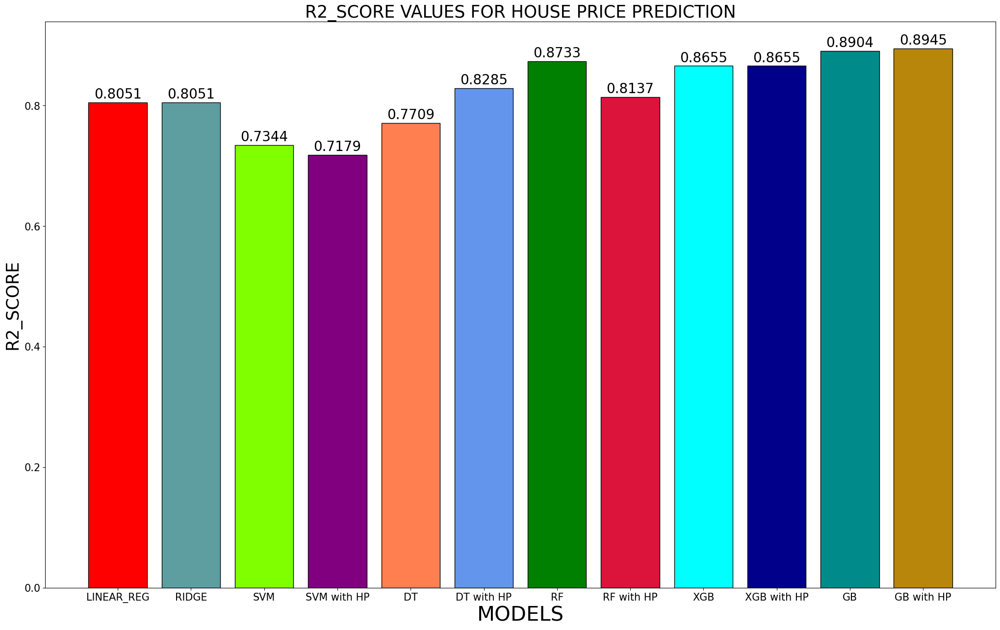

In [271]:
plt.figure(figsize=(25,15),facecolor="white")
plt.title("R2_SCORE VALUES FOR HOUSE PRICE PREDICTION",fontsize=25)
plt.bar(MODEL,R2_SCORE,color=['red','cadetblue','chartreuse','purple','coral','cornflowerblue','green','crimson','cyan','darkblue','darkcyan','darkgoldenrod'],edgecolor="black")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("MODELS",fontsize=30)
plt.ylabel("R2_SCORE",fontsize=25)
for i in range(len(R2_SCORE)):
    plt.text(i,R2_SCORE[i]+0.002,str(round(R2_SCORE[i],4)),ha="center",va="bottom",fontsize=20)

# <font color="green">GRADIENT BOOSTING </font> ALGORITHM GIVES <font color="green">89.45% OF R2_SCORE</font> 